# Important notes

Project was done by:

- Mateusz Janowski (1240288)
- Zuzanna Rybok (1240360)

# Uploading the dataset for CNN

In [ ]:
# Here you need to upload your kaggle.json API token file

from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"zuziaa","key":"b72c15d3af6d294d42114a9ed614995c"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download data from kaggle
!kaggle competitions download -c plant-seedlings-classification


 99% 1.67G/1.69G [00:10<00:00, 242MB/s]
100% 1.69G/1.69G [00:11<00:00, 164MB/s]


In [ ]:
import zipfile
import os

with zipfile.ZipFile("plant-seedlings-classification.zip", 'r') as zip_ref:
    zip_ref.extractall()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import cv2
import itertools

from PIL import Image
from tensorflow.keras.preprocessing.image import img_to_array, ImageDataGenerator
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, Input, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.applications import MobileNetV2

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings("ignore")


## EDA

<Figure size 1000x600 with 0 Axes>

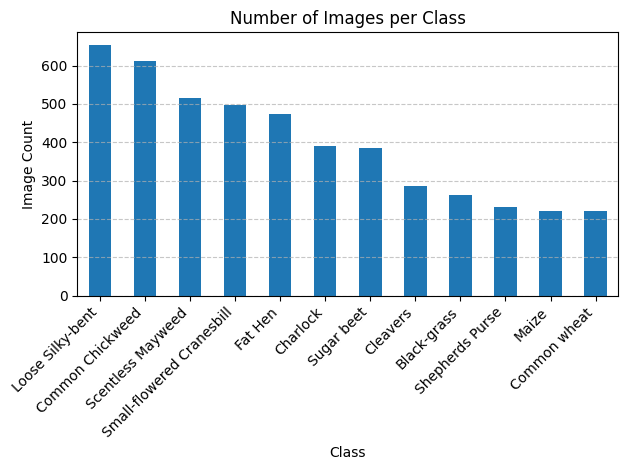

In [ ]:
# Define the path to the training data directory
train_dir = "train"

# Count the number of images per class
class_counts = {
    cls: len(os.listdir(os.path.join(train_dir, cls)))
    for cls in os.listdir(train_dir)
    if os.path.isdir(os.path.join(train_dir, cls))
}

# Convert the class distribution to a DataFrame and sort
df_counts = pd.DataFrame.from_dict(class_counts, orient='index', columns=['Image Count'])
df_counts = df_counts.sort_values(by='Image Count', ascending=False)

# Plot the class distribution
plt.figure(figsize=(10, 6))
df_counts.plot(kind='bar', legend=False)
plt.title("Number of Images per Class")
plt.ylabel("Image Count")
plt.xlabel("Class")
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

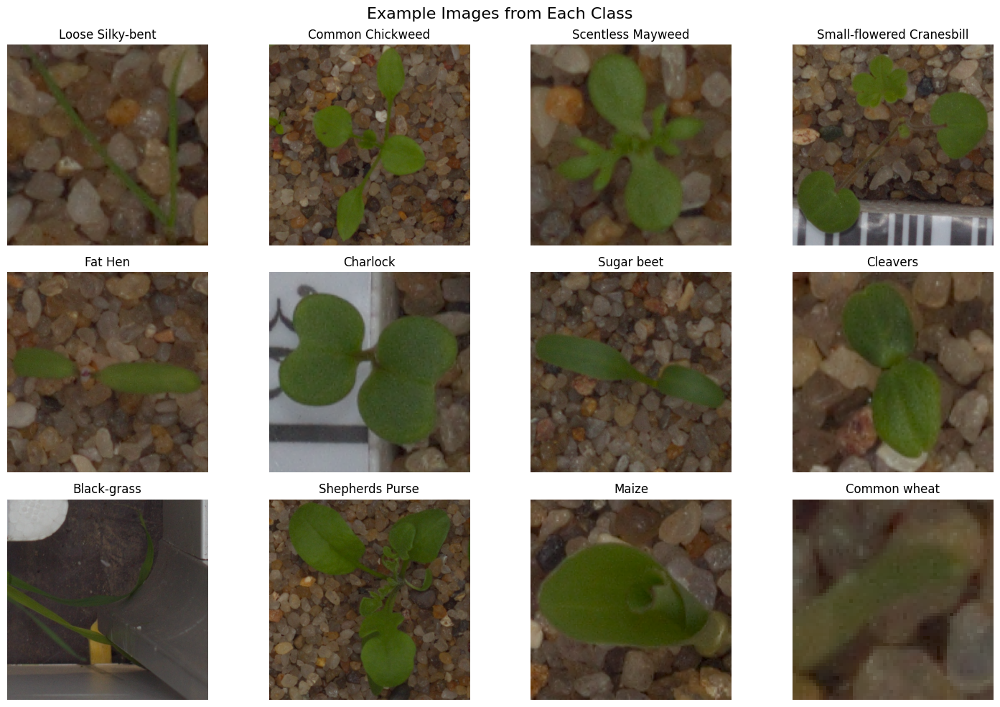

In [ ]:
# Show one random image from each class
fig, axs = plt.subplots(3, 4, figsize=(15, 10))
classes = list(df_counts.index)

for i, ax in enumerate(axs.flat):
    if i < len(classes):
        cls = classes[i]
        image_file = random.choice(os.listdir(os.path.join(train_dir, cls)))
        image_path = os.path.join(train_dir, cls, image_file)
        image = mpimg.imread(image_path)

        ax.imshow(image)
        ax.set_title(cls)
        ax.axis('off')
    else:
        ax.axis('off')

plt.suptitle("Example Images from Each Class", fontsize=16)
plt.tight_layout()
plt.show()


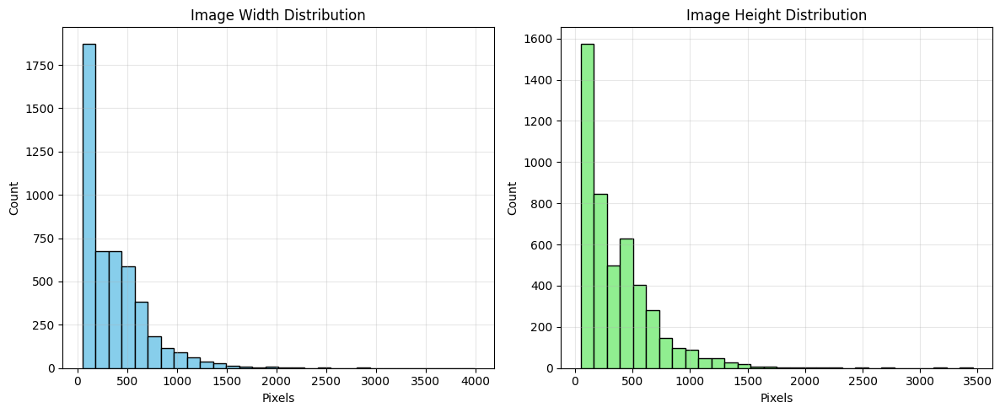

In [ ]:
# Collect image shapes (width, height) per class
image_shapes = []

for cls in os.listdir(train_dir):
    cls_dir = os.path.join(train_dir, cls)
    if not os.path.isdir(cls_dir):
        continue
    for img_name in os.listdir(cls_dir):
        try:
            img_path = os.path.join(cls_dir, img_name)
            img = Image.open(img_path)
            image_shapes.append(img.size)  # (width, height)
        except:
            print(f"Could not open image: {img_path}")

# Create a DataFrame with width and height
df_shapes = pd.DataFrame(image_shapes, columns=['width', 'height'])

# Plot width and height distributions
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
axs[0].hist(df_shapes['width'], bins=30, color='skyblue', edgecolor='black')
axs[0].set_title('Image Width Distribution')
axs[1].hist(df_shapes['height'], bins=30, color='lightgreen', edgecolor='black')
axs[1].set_title('Image Height Distribution')

for ax in axs:
    ax.set_xlabel('Pixels')
    ax.set_ylabel('Count')
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()



The histograms above illustrate the distribution of image widths (left) and heights (right) across the dataset.

- A majority of the images have relatively small dimensions, with both width and height concentrated between 100 and 600 pixels.
- There is a **long tail** of images with significantly larger dimensions, (beyond 3000 pixels), but these are rare outliers.
- The variability in image sizes suggests that we might need to resize or normalize our dta to ensure consistency before feeding it into a CNN.


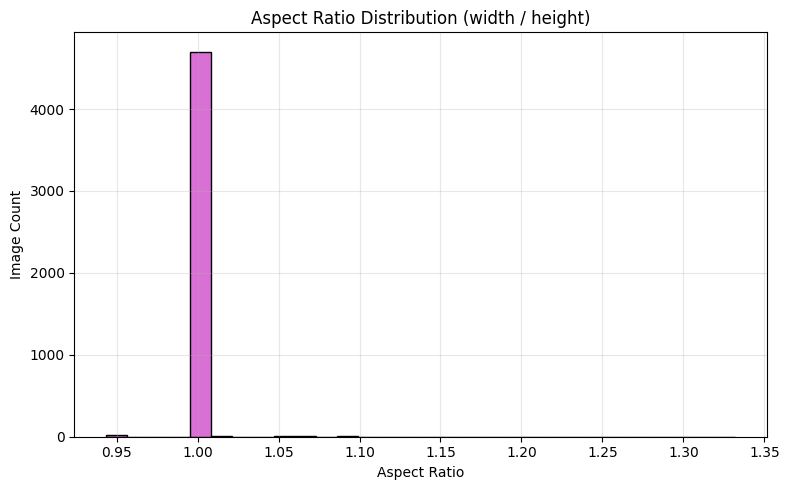

In [ ]:
# Add aspect ratio column
df_shapes['aspect_ratio'] = df_shapes['width'] / df_shapes['height']

# Plot histogram of aspect ratios
plt.figure(figsize=(8, 5))
plt.hist(df_shapes['aspect_ratio'], bins=30, color='orchid', edgecolor='black')
plt.title("Aspect Ratio Distribution (width / height)")
plt.xlabel("Aspect Ratio")
plt.ylabel("Image Count")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


The histogram above shows the distribution of aspect ratios (width / height) for all images in the dataset.

- The significant majority of images have an aspect ratio very close to 1, indicating that most images are either square or nearly square.

So as the dataset is mostly composed of square images, standardizing all inputs to a square resolution (e.g., 224×224) during preprocessing it is appropriate and unlikely to distort the image content.


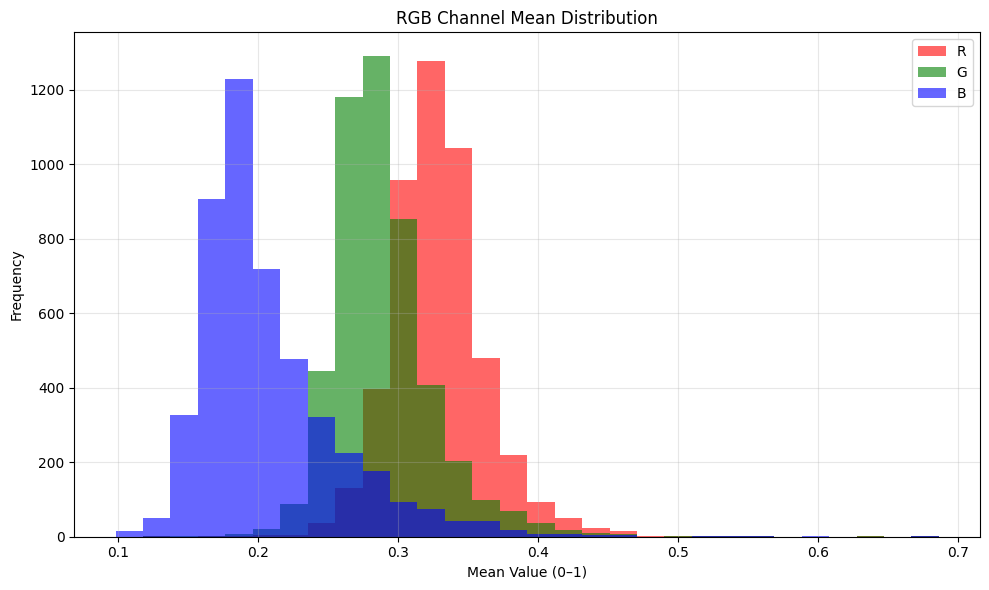

In [ ]:
def compute_rgb_means(image_path):
    try:
        img = Image.open(image_path).convert('RGB')
        img_np = np.array(img) / 255.0
        r_mean = np.mean(img_np[:, :, 0])
        g_mean = np.mean(img_np[:, :, 1])
        b_mean = np.mean(img_np[:, :, 2])
        return r_mean, g_mean, b_mean
    except:
        return None

# Compute means for a sample of images (or all if feasible)
rgb_means = []

for cls in os.listdir(train_dir):
    cls_dir = os.path.join(train_dir, cls)
    for img_name in os.listdir(cls_dir):
        img_path = os.path.join(cls_dir, img_name)
        means = compute_rgb_means(img_path)
        if means:
            rgb_means.append(means)

# Convert to DataFrame
df_rgb = pd.DataFrame(rgb_means, columns=['R', 'G', 'B'])

# Plot histograms of R, G, B with matching colors
df_rgb.plot(kind='hist', bins=30, alpha=0.6, figsize=(10, 6),
            title='RGB Channel Mean Distribution',
            color=['red', 'green', 'blue'])
plt.xlabel("Mean Value (0–1)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Red channel has the highest average intensity values with peak around 0.35, indicating a strong presence of red tones in the dataset.
Most dominant in brightness.

Green channel has lightly lower intensities, peaking around 0.25–0.3 but still contributes significantly to image coloration.

Blue channel has the lowest average intensity, peaking at 0.2. That can suggests less green content or generally darker green tones.

**Conclusion**:
- All three channels show unimodal and distinct distributions, indicating a varied and natural color composition.

- Images are not grayscale and show no signs of being overexposed.

In [ ]:
grayscale_images = []

for cls in os.listdir(train_dir):
    cls_dir = os.path.join(train_dir, cls)
    for img_name in os.listdir(cls_dir):
        img_path = os.path.join(cls_dir, img_name)
        try:
            img = Image.open(img_path)
            if img.mode == 'L':
                grayscale_images.append(img_path)
            elif img.mode == 'RGB':
                img_array = np.array(img)
                if np.all(img_array[..., 0] == img_array[..., 1]) and np.all(img_array[..., 1] == img_array[..., 2]):
                    grayscale_images.append(img_path)
            else:
                grayscale_images.append(img_path)  # in other modes (RGBA, etc.)
        except:
            grayscale_images.append(img_path)  # unreadable or corrupted

print(f"Found {len(grayscale_images)} grayscale or unreadable images.")
for path in grayscale_images:
    print(path)


Found 24 grayscale or unreadable images.
train/Black-grass/77629b9e3.png
train/Black-grass/ae8f69724.png
train/Black-grass/a8ab1ff26.png
train/Loose Silky-bent/881498f15.png
train/Loose Silky-bent/780b7ab63.png
train/Loose Silky-bent/180a7bc07.png
train/Loose Silky-bent/7324d3cc4.png
train/Loose Silky-bent/02b15993e.png
train/Loose Silky-bent/d1653b4c3.png
train/Loose Silky-bent/4a0df8be4.png
train/Loose Silky-bent/3fd2b83fc.png
train/Loose Silky-bent/875ef92d7.png
train/Loose Silky-bent/9cf880bda.png
train/Loose Silky-bent/5cb45767e.png
train/Loose Silky-bent/e513efb9a.png
train/Loose Silky-bent/b81690ccf.png
train/Loose Silky-bent/d31724b7f.png
train/Loose Silky-bent/3d9f8222d.png
train/Loose Silky-bent/0cf9eb4ab.png
train/Loose Silky-bent/df615189b.png
train/Loose Silky-bent/ab47c78db.png
train/Loose Silky-bent/ae1c97a42.png
train/Loose Silky-bent/7a8370ede.png
train/Loose Silky-bent/f5602e151.png


Through this code we scan the image directory to detect grayscale or corrupted files that cannot be opened as RGB. It identified 21 such images and printed their full paths for manual inspection or removal. These images may cause issues during model training, so it’s recommended to filter them out or convert them to the RGB format.

## Preprocessing

# Approach 1 - Keep grayscale or unreadable images, but convert them to RGB format

In [ ]:
# Parameters
IMG_SIZE = 96
DATASET_DIR = "train"

# Containers
images = []
labels = []
class_names = sorted([d for d in os.listdir(DATASET_DIR) if os.path.isdir(os.path.join(DATASET_DIR, d))])

# Iterate through class folders and load images
for class_name in class_names:
    class_dir = os.path.join(DATASET_DIR, class_name)
    for filename in os.listdir(class_dir):
        img_path = os.path.join(class_dir, filename)
        try:
            # Open image, convert to RGB and resize
            img = Image.open(img_path).convert("RGB")
            img = img.resize((IMG_SIZE, IMG_SIZE))
            img_array = img_to_array(img) / 255.0  # Normalize to 0–1
            images.append(img_array)
            labels.append(class_name)
        except Exception as e:
            print(f"Skipping file {img_path}: {e}")

# Convert to numpy arrays
X = np.array(images)
y = np.array(labels)

print("Images loaded and resized")
print(f"Image shape: {X.shape}")
print(f"Unique classes: {len(np.unique(y))}")


Images loaded and resized
Image shape: (4750, 96, 96, 3)
Unique classes: 12


To ensure consistency in input data shape and simplify model training, we resize all images to a uniform size of 224×224 pixels, convert all images to RGB format and  normalize pixel values by scaling them to the [0, 1] range. That will help stabilize training and accelerates convergence.


In [ ]:
# Create label-to-index mapping
label_to_index = {label: idx for idx, label in enumerate(np.unique(y))}
index_to_label = {idx: label for label, idx in label_to_index.items()}

# Encode string labels to integer indices
y_encoded = np.array([label_to_index[label] for label in y])

# One-hot encode labels
y_categorical = to_categorical(y_encoded, num_classes=len(label_to_index))

# Split 1: train and test1 (70% / 30%)
X_train, X_test1, y_train, y_test1 = train_test_split(
    X, y_categorical, test_size=0.30, stratify=y_categorical, random_state=42
)

# Split 2: test1 into val and test (50%/50% of 30% => 15%/15%)
X_val, X_test, y_val, y_test = train_test_split(
    X_test1, y_test1, test_size=0.50, stratify=y_test1, random_state=42
)


print("Labels encoded and data split finished.")
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_val shape:   {X_val.shape}")
print(f"y_val shape:   {y_val.shape}")
print(f"X_test shape:  {X_test.shape}")
print(f"y_test shape:  {y_test.shape}")


Labels encoded and data split finished.
X_train shape: (3325, 96, 96, 3)
y_train shape: (3325, 12)
X_val shape:   (712, 96, 96, 3)
y_val shape:   (712, 12)
X_test shape:  (713, 96, 96, 3)
y_test shape:  (713, 12)


In [ ]:
# --- Settings for green segmentation ---
lower_green = (25, 40, 50)  # Lower HSV bound for green
upper_green = (75, 255, 255)  # Upper HSV bound for green
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))  # Elliptical kernel for morphology

# --- Preprocessing function ---
def preprocess_images(X):
    preprocessed = []
    for img in X:
        # 1. Convert image from float [0,1] to uint8 [0,255]
        img_uint8 = (img * 255).astype(np.uint8)

        # 2. Resize image (optional) – not needed if image is already 224x224
        resize_img = img_uint8

        # 3. Apply Gaussian blur to reduce noise
        Gblur_img = cv2.GaussianBlur(resize_img, (3, 3), 0)

        # 4. Convert image from RGB to HSV color space
        hsv_img = cv2.cvtColor(Gblur_img, cv2.COLOR_RGB2HSV)

        # 5. Segment green regions using HSV range
        mask = cv2.inRange(hsv_img, lower_green, upper_green)

        # 6. Apply morphological closing to remove noise and fill gaps
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

        # 7. Create boolean mask
        bMask = mask > 0

        # 8. Apply mask to original image to keep only green regions
        clearImg = np.zeros_like(resize_img, np.uint8)
        clearImg[bMask] = resize_img[bMask]

        # 9. Convert cleaned image back to float32 [0,1]
        clearImg_float = clearImg.astype(np.float32) / 255.0

        preprocessed.append(clearImg_float)

    return np.asarray(preprocessed)

# --- Apply preprocessing to dataset splits ---
X_train_cleaned = preprocess_images(X_train)
X_val_cleaned = preprocess_images(X_val)
X_test_cleaned = preprocess_images(X_test)


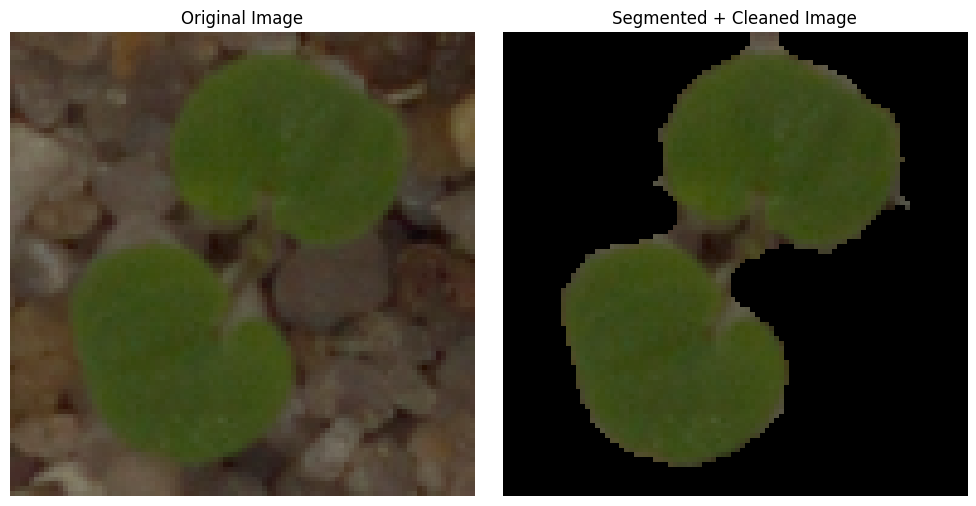

In [ ]:
# --- Display a random sample image (original vs. processed) ---

# Random index from training set
i = np.random.randint(0, len(X_train))

# Original and preprocessed images
original = X_train[i]
processed = X_train_cleaned[i]

# Create a side-by-side plot
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Show original image
axs[0].imshow(original)
axs[0].set_title("Original Image")

# Show segmented and cleaned image
axs[1].imshow(processed)
axs[1].set_title("Segmented + Cleaned Image")

# Turn off axes for both subplots
for ax in axs:
    ax.axis("off")

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


Further cleaning images and focus on removing background based on green hue range, filling small holes and removing noises in the binary mask and sharpening edges and structural features of the plants.

The resulting image retains only the relevant plant area and is normalized to [0, 1] for use in the CNN model.


In [ ]:
print(f"Cleaned training shape: {X_train_cleaned.shape}")
print(f"Cleaned validation shape: {X_val_cleaned.shape}")
print(f"Cleaned test shape: {X_test_cleaned.shape}")

Cleaned training shape: (3325, 96, 96, 3)
Cleaned validation shape: (712, 96, 96, 3)
Cleaned test shape: (713, 96, 96, 3)


Full cleaning:

- Cropped to retain only the seedling,
- Morphologically cleaned of artifacts,
- Sharpened to highlight structural features,
- Normalized to the range [0, 1].

## Model Building

In [ ]:
ins = X_train_cleaned.shape[1:]

# 1. Overfitted model
def build_overfitted_model(input_shape=(ins[0], ins[1], ins[2]), num_classes=12):
    model = Sequential([
        Input(shape=input_shape),
        Conv2D(32, (3, 3), activation='relu', padding='same'),
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        Flatten(),
        Dense(128, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])
    return model


# 2. Best Model (should be around 85% val acc)
def build_best_model(input_shape=(ins[0], ins[1], ins[2]), num_classes=12):
    model = Sequential()

    # 1st Convolutional Block
    model.add(Conv2D(32, (3, 3), input_shape=input_shape, activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

    # 2nd Convolutional Block
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

    # 3rd Convolutional Block
    model.add(Conv2D(64, (3, 3), activation='relu', padding='valid'))  # No padding
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2))

    # Flatten before Dense layers
    model.add(Flatten())

    # Fully Connected Layers
    model.add(BatchNormalization())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.2))

    model.add(BatchNormalization())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.2))

    # Output Layer
    model.add(Dense(num_classes, activation='softmax'))

    return model

## Running models with no callbacks to see the performance

In [ ]:
model = build_overfitted_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

history_AP1_overfitted = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8
)

Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - accuracy: 0.2772 - loss: 2.1821 - precision: 0.5220 - recall: 0.0605 - val_accuracy: 0.4986 - val_loss: 1.4717 - val_precision: 0.7178 - val_recall: 0.2893
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - accuracy: 0.6628 - loss: 1.0076 - precision: 0.7886 - recall: 0.5103 - val_accuracy: 0.5449 - val_loss: 1.3776 - val_precision: 0.6903 - val_recall: 0.4382
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.9744 - loss: 0.1217 - precision: 0.9789 - recall: 0.9624 - val_accuracy: 0.5421 - val_loss: 1.9015 - val_precision: 0.5661 - val_recall: 0.4930
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.9998 - loss: 0.0087 - precision: 0.9998 - recall: 0.9998 - val_accuracy: 0.5183 - val_loss: 2.3901 - val_precision: 0.5435 - val_recall: 0.4916
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - accuracy: 0.9994 - loss: 0.0030 - precision: 0.9994 - recall: 0.9993 - val_accuracy: 0.5520 - va

In [ ]:
results_AP1_overfitted = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.4799 - loss: 3.9824 - precision: 0.4868 - recall: 0.4567


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step
Accuracy:  0.45722299814224243
Precision:  0.4692653715610504
Recall:  0.43899017572402954


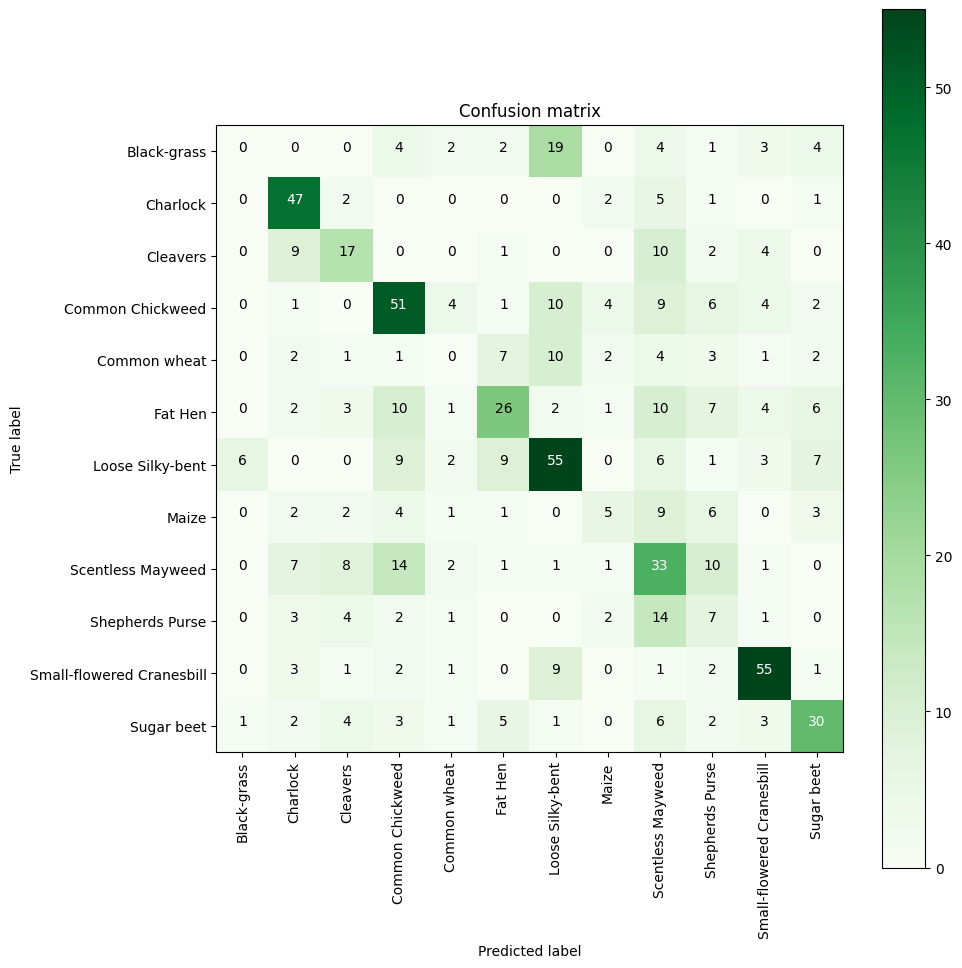

In [ ]:
# --- Function to plot the confusion matrix ---
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Greens):
    fig = plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)  # Display the matrix as an image
    plt.title(title)
    plt.colorbar()  # Show color scale
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)  # Set x-axis labels
    plt.yticks(tick_marks, classes)               # Set y-axis labels

    if normalize:
        # Normalize values to percentages
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    # Add values inside the cells
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f'{cm[i, j]}',
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    # Layout and labels
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Get predicted class indices
trueY = np.argmax(y_test, axis=1)         # Get true class indices

# --- Generate confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- Class names (based on your index_to_label dictionary) ---
categ = list(index_to_label.values())   # Convert dict to list of class names

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print evaluation metrics ---
print("Accuracy: ", results_AP1_overfitted[1])
print("Precision: ", results_AP1_overfitted[2])
print("Recall: ", results_AP1_overfitted[3])


In [ ]:
model = build_best_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)


history_AP1_better = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    shuffle = True
    )


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - accuracy: 0.3110 - loss: 2.3196 - precision: 0.4283 - recall: 0.1958 - val_accuracy: 0.1110 - val_loss: 8.6761 - val_precision: 0.1114 - val_recall: 0.1110
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - accuracy: 0.5487 - loss: 1.3144 - precision: 0.6565 - recall: 0.4399 - val_accuracy: 0.5463 - val_loss: 1.3862 - val_precision: 0.6333 - val_recall: 0.4972
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6095 - loss: 1.1380 - precision: 0.7253 - recall: 0.5074 - val_accuracy: 0.5365 - val_loss: 1.4637 - val_precision: 0.6118 - val_recall: 0.4803
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6778 - loss: 0.9523 - precision: 0.7495 - recall: 0.5804 - val_accuracy: 0.6503 - val_loss: 1.1720 - val_precision: 0.6917 - val_recall: 0.5955
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.7349 - loss: 0.8041 - precision: 0.7967 - recall: 0.6637 - val_accuracy: 0.7008 - val_loss:

In [ ]:
results_AP1_better = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.8247 - loss: 0.7927 - precision: 0.8363 - recall: 0.8239


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step
Accuracy:  0.8246844410896301
Precision:  0.8409742116928101
Recall:  0.8232818841934204


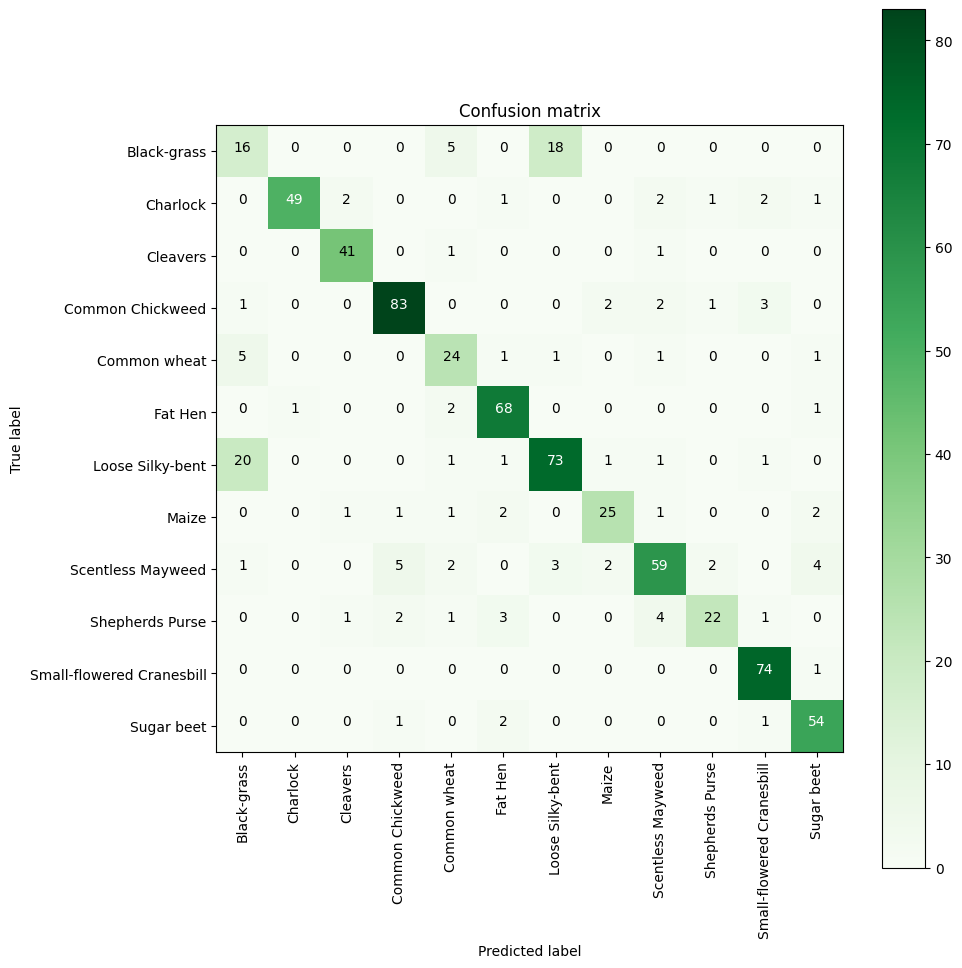

In [ ]:
# --- Function to plot the confusion matrix ---
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Greens):
    fig = plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)  # Display matrix as image
    plt.title(title)
    plt.colorbar()  # Add color scale
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)  # X-axis class names
    plt.yticks(tick_marks, classes)               # Y-axis class names

    # Normalize values if requested
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    # Add numerical values to each cell
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f'{cm[i, j]}',
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    # Final formatting
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)               # Get raw predicted probabilities
predYClasses = np.argmax(predY, axis=1)             # Convert to predicted class indices
trueY = np.argmax(y_test, axis=1)                   # Extract true class indices from one-hot labels

# --- Compute the confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- Class labels (from your index_to_label dictionary) ---
categ = list(index_to_label.values())  # Convert dictionary to list of class names

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print evaluation metrics ---
print("Accuracy: ", results_AP1_better[1])    # Model accuracy
print("Precision: ", results_AP1_better[2])   # Model precision (macro or weighted depending on your setup)
print("Recall: ", results_AP1_better[3])      # Model recall


## Model comparison - approach 1, no callbacks

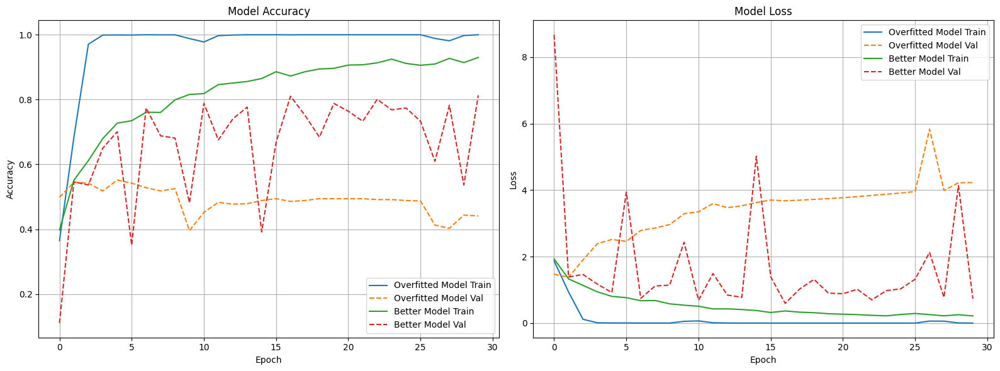

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model": history_AP1_overfitted.history if 'history_AP1_overfitted' in globals() else None,
    "Better Model": history_AP1_better.history if 'history_AP1_better' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Running models with callbacks

To stabilize the model's validation loss we add callback to reduce learning_rate by 10%. We also add Early stopping to prevent overfitting

In [ ]:
model = build_overfitted_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

history_AP1_overfitted_with_callbacks = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    callbacks = callbacks
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - accuracy: 0.3558 - loss: 2.0136 - precision: 0.5591 - recall: 0.1598 - val_accuracy: 0.6419 - val_loss: 1.0550 - val_precision: 0.7664 - val_recall: 0.5253 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.7832 - loss: 0.6441 - precision: 0.8397 - recall: 0.7213 - val_accuracy: 0.6096 - val_loss: 1.2874 - val_precision: 0.6779 - val_recall: 0.5351 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - accuracy: 0.9805 - loss: 0.0892 - precision: 0.9853 - recall: 0.9715 - val_accuracy: 0.6376 - val_loss: 1.6393 - val_precision: 0.6627 - val_recall: 0.6180 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.9987 - loss: 0.0100 - precision: 0.9991 - recall: 0.9987 - val_accuracy: 0.6601 - val_loss: 1.6247 - val_precision: 0.6832 - val_recall: 0.6390 - learning_rate: 5.0000e-04
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/ste

In [ ]:
results_AP1_overfitted_with_callbacks = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.6629 - loss: 1.0426 - precision: 0.7697 - recall: 0.5607


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Accuracy:  0.6465638279914856
Precision:  0.7639999985694885
Recall:  0.5357643961906433


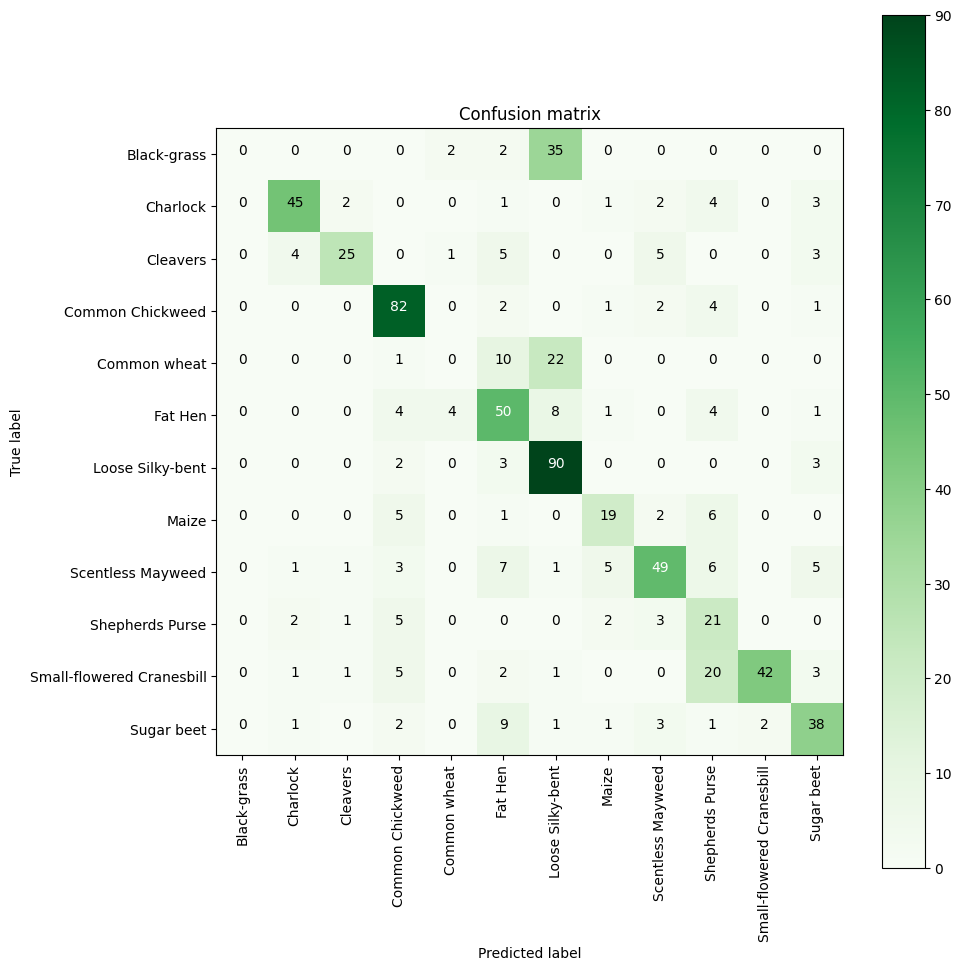

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)               # Get predicted probabilities for each class
predYClasses = np.argmax(predY, axis=1)             # Extract predicted class indices
trueY = np.argmax(y_test, axis=1)                   # Extract true class indices from one-hot encoding

# --- Compute confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (from your index_to_label dictionary) ---
categ = list(index_to_label.values())               # Convert dict to list of class labels

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print evaluation metrics ---
print("Accuracy: ", results_AP1_overfitted_with_callbacks[1])     # Accuracy score from model evaluation
print("Precision: ", results_AP1_overfitted_with_callbacks[2])    # Precision (macro or weighted, depending on model.compile)
print("Recall: ", results_AP1_overfitted_with_callbacks[3])       # Recall (macro or weighted)


In [ ]:
model = build_best_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

history_AP1_better_with_callbacks = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    shuffle = True,
    callbacks = callbacks
    )


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 19ms/step - accuracy: 0.3289 - loss: 2.2627 - precision: 0.4197 - recall: 0.2052 - val_accuracy: 0.0716 - val_loss: 6.0213 - val_precision: 0.0697 - val_recall: 0.0660 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - accuracy: 0.5413 - loss: 1.3631 - precision: 0.6480 - recall: 0.4194 - val_accuracy: 0.6208 - val_loss: 1.1367 - val_precision: 0.6963 - val_recall: 0.5604 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6506 - loss: 1.0457 - precision: 0.7275 - recall: 0.5403 - val_accuracy: 0.6292 - val_loss: 1.2872 - val_precision: 0.6857 - val_recall: 0.5913 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.6795 - loss: 0.9794 - precision: 0.7620 - recall: 0.5633 - val_accuracy: 0.6152 - val_loss: 1.3443 - val_precision: 0.6639 - val_recall: 0.5688 - learning_rate: 0.0010
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accurac

In [ ]:
results_AP1_better_with_callbacks = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.8424 - loss: 0.4702 - precision: 0.8564 - recall: 0.8373


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Accuracy:  0.8541374206542969
Precision:  0.8701298832893372
Recall:  0.8457223176956177


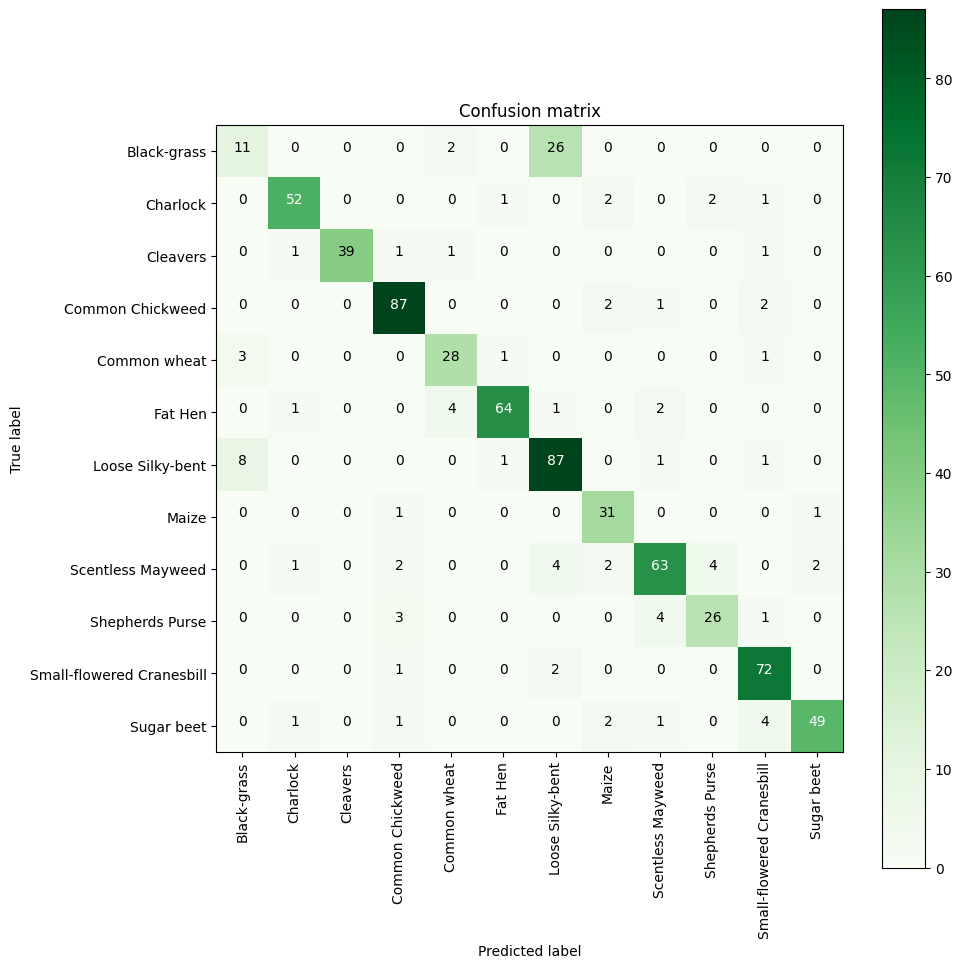

In [ ]:
# --- Model predictions on the test dataset ---
predY = model.predict(X_test_cleaned)               # Predict class probabilities
predYClasses = np.argmax(predY, axis=1)             # Get predicted class indices
trueY = np.argmax(y_test, axis=1)                   # Get true class indices from one-hot labels

# --- Generate confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (from your index_to_label dictionary) ---
categ = list(index_to_label.values())               # Convert dictionary to list of class names

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print performance metrics ---
print("Accuracy: ", results_AP1_better_with_callbacks[1])     # Accuracy (from model.evaluate)
print("Precision: ", results_AP1_better_with_callbacks[2])    # Precision (requires metric in model.compile)
print("Recall: ", results_AP1_better_with_callbacks[3])       # Recall (requires metric in model.compile)


## Model comparison - approach 1, with callbacks

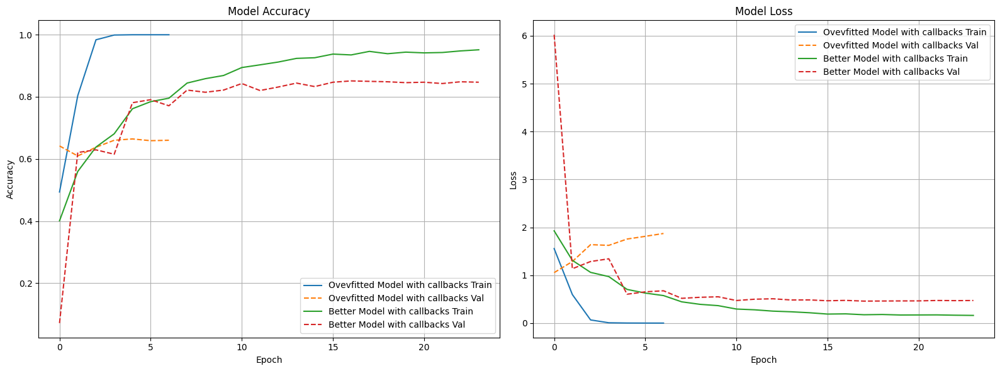

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Ovevfitted Model with callbacks": history_AP1_overfitted_with_callbacks.history if 'history_AP1_overfitted_with_callbacks' in globals() else None,
    "Better Model with callbacks": history_AP1_better_with_callbacks.history if 'history_AP1_better_with_callbacks' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Adding data-augmentation and running models with it

In [ ]:
def get_augmented_generator(X_train, y_train, batch_size=8):
    datagen = ImageDataGenerator(
        rotation_range=10,             # slight rotation, plants don't rotate much
        width_shift_range=0.05,        # small horizontal shifts
        height_shift_range=0.05,       # small vertical shifts
        zoom_range=0.05,               # light zoom to simulate camera distance
        horizontal_flip=True,          # mirror symmetry of plants
        fill_mode='nearest'            # filling strategy for transformed pixels
    )

    return datagen.flow(X_train, y_train, batch_size=batch_size, shuffle=True)


In [ ]:
# Build the best model (architecture stays the same – data will be augmented)
model = build_overfitted_model()  # you don't need a separate "build_augmented_best_model"

# Compile the model with optimizer, loss function and metrics
model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Define callbacks for learning rate adjustment and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Create data generator with real-time augmentation
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model using the generator
history_AP1_overfitted_augmented = model.fit(
    train_gen,                                    # training data with augmentation
    validation_data=(X_val_cleaned, y_val),       # static validation set
    epochs=30,
    shuffle=True,
    callbacks=callbacks
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - accuracy: 0.3677 - loss: 2.0051 - precision_5: 0.5370 - recall_5: 0.1478 - val_accuracy: 0.6376 - val_loss: 1.1480 - val_precision_5: 0.7788 - val_recall_5: 0.4747 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - accuracy: 0.6143 - loss: 1.1276 - precision_5: 0.7317 - recall_5: 0.4644 - val_accuracy: 0.6756 - val_loss: 0.9674 - val_precision_5: 0.8085 - val_recall_5: 0.5098 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 14s 34ms/step - accuracy: 0.6747 - loss: 0.9869 - precision_5: 0.7643 - recall_5: 0.5462 - val_accuracy: 0.7247 - val_loss: 0.9063 - val_precision_5: 0.7914 - val_recall_5: 0.5969 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - accuracy: 0.7319 - loss: 0.7919 - precision_5: 0.7961 - recall_5: 0.6539 - val_accuracy: 0.7570 - val_loss: 0.7439 - val_precision_5: 0.8283 - val_recall_5: 0.6980 - learning_rate: 0.0010
Epoch 5/30
416/416 ━━━━━

In [ ]:
results_AP1_overfitted_augmented = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8285 - loss: 0.5500 - precision_5: 0.8548 - recall_5: 0.8041


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Accuracy:  0.8401122093200684
Precision:  0.8641063570976257
Recall:  0.8204768300056458


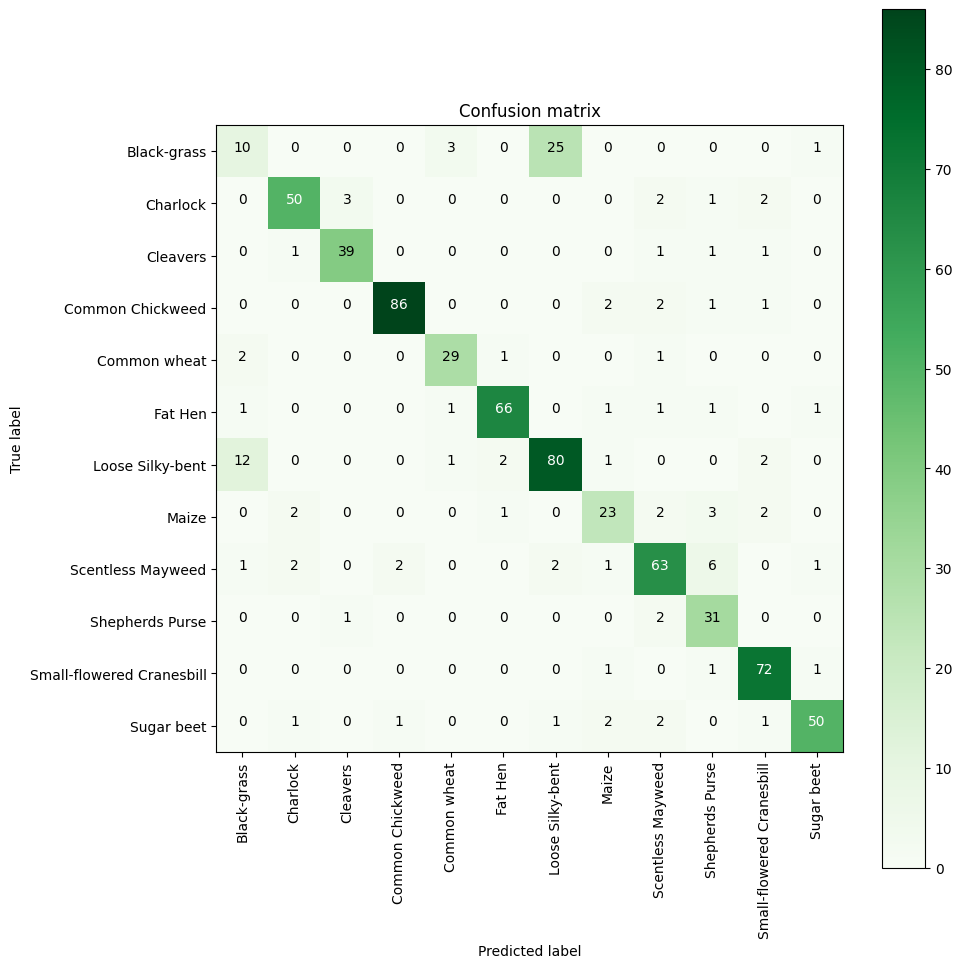

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)               # Predict probabilities for test images
predYClasses = np.argmax(predY, axis=1)             # Convert probabilities to predicted class indices
trueY = np.argmax(y_test, axis=1)                   # Convert one-hot encoded labels to class indices

# --- Generate the confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class labels (from index_to_label dictionary) ---
categ = list(index_to_label.values())               # Extract class names from dictionary

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print model evaluation metrics ---
print("Accuracy: ", results_AP1_overfitted_augmented[1])     # Accuracy from model.evaluate()
print("Precision: ", results_AP1_overfitted_augmented[2])    # Precision (must be included in model's metrics)
print("Recall: ", results_AP1_overfitted_augmented[3])       # Recall (must be included in model's metrics)


In [ ]:
# Build the best model (architecture stays the same – data will be augmented)
model = build_best_model()  # you don't need a separate "build_augmented_best_model"

# Compile the model with optimizer, loss function and metrics
model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Define callbacks for learning rate adjustment and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Create data generator with real-time augmentation
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model using the generator
history_AP1_better_augmented = model.fit(
    train_gen,                                    # training data with augmentation
    validation_data=(X_val_cleaned, y_val),       # static validation set
    epochs=30,
    shuffle=True,
    callbacks=callbacks
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step - accuracy: 0.3023 - loss: 2.3397 - precision_6: 0.4010 - recall_6: 0.1882 - val_accuracy: 0.0604 - val_loss: 6.4411 - val_precision_6: 0.0613 - val_recall_6: 0.0604 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.4959 - loss: 1.5342 - precision_6: 0.6066 - recall_6: 0.3658 - val_accuracy: 0.5197 - val_loss: 1.9156 - val_precision_6: 0.5679 - val_recall_6: 0.4817 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5570 - loss: 1.3491 - precision_6: 0.6663 - recall_6: 0.4358 - val_accuracy: 0.5899 - val_loss: 1.3108 - val_precision_6: 0.6678 - val_recall_6: 0.5449 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.6115 - loss: 1.1524 - precision_6: 0.6985 - recall_6: 0.4919 - val_accuracy: 0.4129 - val_loss: 3.3015 - val_precision_6: 0.4414 - val_recall_6: 0.4017 - learning_rate: 0.0010
Epoch 5/30
416/416 ━━━━━

In [ ]:
results_AP1_better_augmented = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.8538 - loss: 0.3641 - precision_6: 0.8860 - recall_6: 0.8387


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Accuracy:  0.8653576374053955
Precision:  0.8936484456062317
Recall:  0.8485273718833923


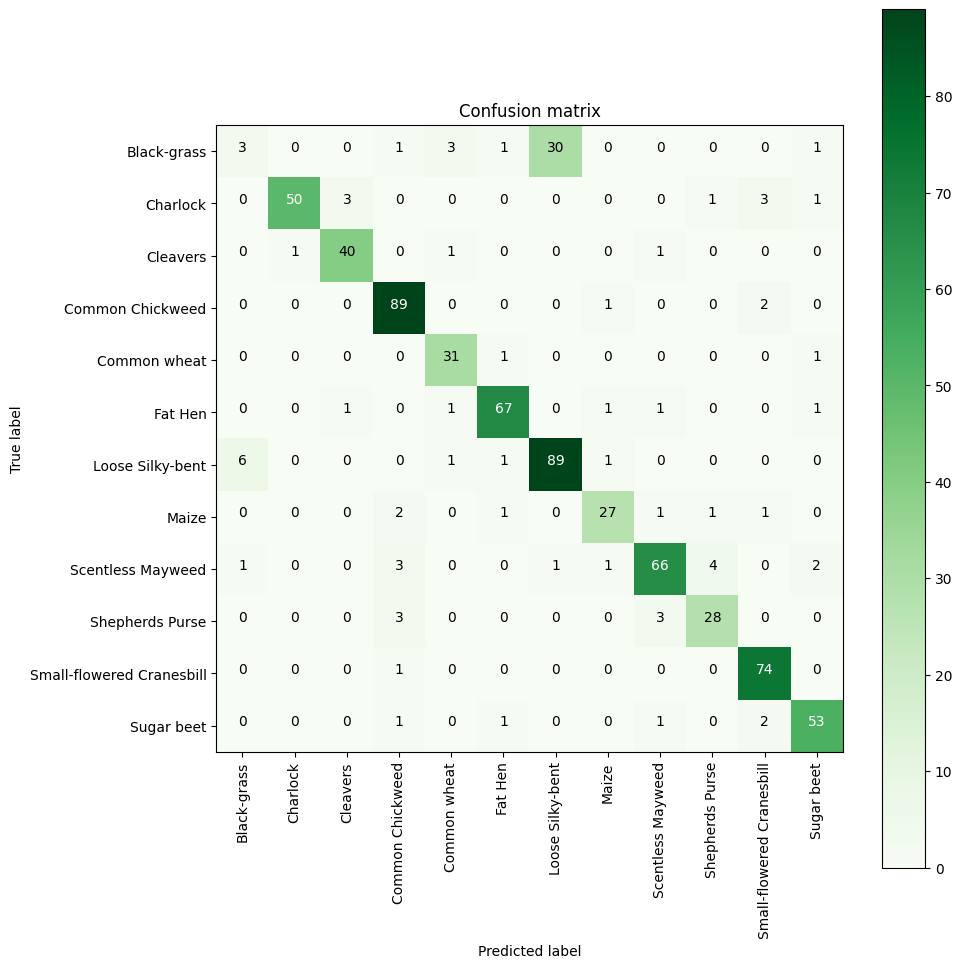

In [ ]:
# --- Predicting model output on the test set ---
predY = model.predict(X_test_cleaned)               # Predict class probabilities
predYClasses = np.argmax(predY, axis=1)             # Get predicted class labels
trueY = np.argmax(y_test, axis=1)                   # Get true class labels from one-hot encoded format

# --- Generate the confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- Convert class indices to label names ---
categ = list(index_to_label.values())               # Convert index-to-label dict to list

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print evaluation metrics ---
print("Accuracy: ", results_AP1_better_augmented[1])     # Overall accuracy
print("Precision: ", results_AP1_better_augmented[2])    # Precision metric from model.evaluate()
print("Recall: ", results_AP1_better_augmented[3])       # Recall metric from model.evaluate()


## Model comparison - approach 1, with callbacks and data augmentation

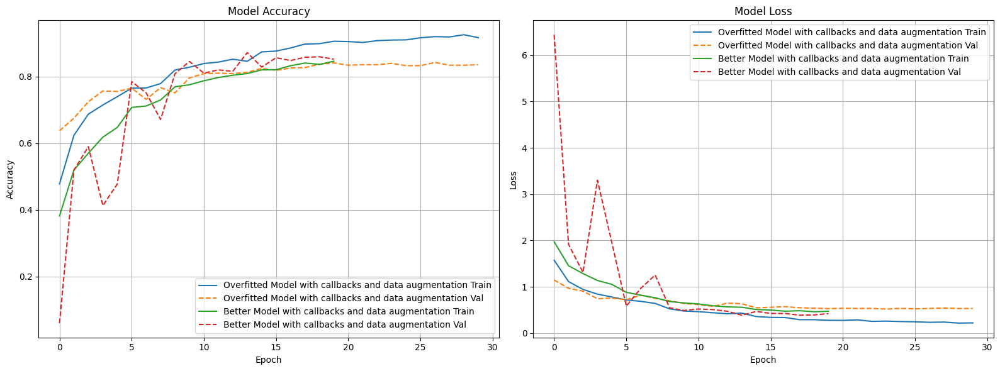

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model with callbacks and data augmentation": history_AP1_overfitted_augmented.history if 'history_AP1_overfitted_augmented' in globals() else None,
    "Better Model with callbacks and data augmentation": history_AP1_better_augmented.history if 'history_AP1_better_augmented' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Running the pre-trained MobileNet model

In [ ]:
def build_mobilenet_model(input_shape=(96,96, 3), num_classes=12):
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_tensor=Input(shape=input_shape))

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation='relu')(x)
    output = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=output)

    # Freeze base model initially
    for layer in base_model.layers:
        layer.trainable = False

    return model


In [ ]:
model = build_mobilenet_model(input_shape=ins, num_classes=12)

model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Augmented data generator
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model
history_AP1_mobilenet = model.fit(
    train_gen,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    callbacks=callbacks
)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - accuracy: 0.3494 - loss: 2.1301 - precision_7: 0.5030 - recall_7: 0.1313 - val_accuracy: 0.5772 - val_loss: 1.2665 - val_precision_7: 0.7150 - val_recall_7: 0.3806 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - accuracy: 0.5518 - loss: 1.2718 - precision_7: 0.6978 - recall_7: 0.3873 - val_accuracy: 0.6306 - val_loss: 1.0907 - val_precision_7: 0.7601 - val_recall_7: 0.4494 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 0.6206 - loss: 1.0665 - precision_7: 0.7489 - recall_7: 0.4654 - val_accuracy: 0.6124 - val_loss: 1.0946 - val_precision_7: 0.7019 - val_recall_7: 0.5225 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 0.6395 - loss: 1.0193 - precision_7: 0.7487 - recall_7: 0.5275 - val_accuracy: 0.6419 - val_loss: 0.9832 - val_precision_7: 0.7408 - val_recall_7: 0.5379

In [ ]:
results_AP1_mobilenet = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - accuracy: 0.7763 - loss: 0.7224 - precision_7: 0.8376 - recall_7: 0.7155


## Results of pre-trained model

23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step
Accuracy:  0.7755960822105408
Precision:  0.8266452550888062
Recall:  0.722300112247467


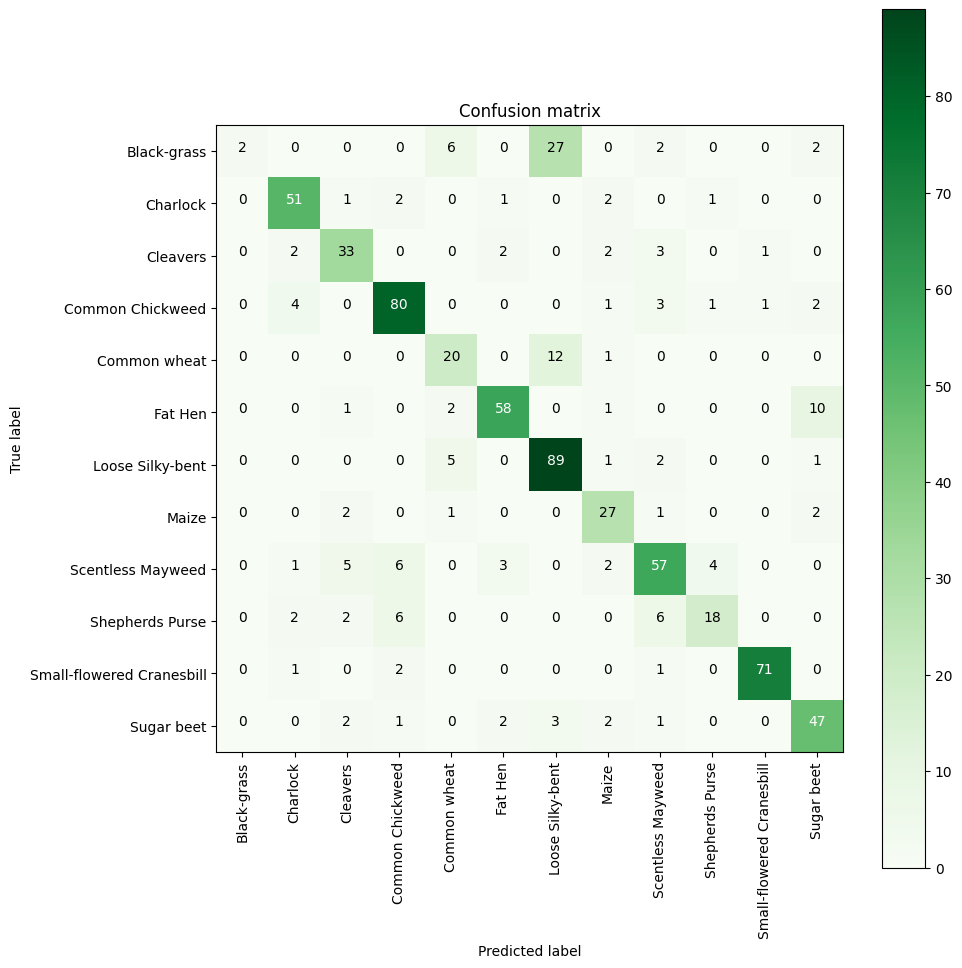

In [ ]:
# --- Predict model output on the test dataset ---
predY = model.predict(X_test_cleaned)                # Predict probabilities
predYClasses = np.argmax(predY, axis=1)              # Convert probabilities to predicted class indices
trueY = np.argmax(y_test, axis=1)                    # Extract true class indices from one-hot labels

# --- Compute the confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- Get list of class names from index_to_label dictionary ---
categ = list(index_to_label.values())                # Convert dict to list of class labels

# --- Plot the confusion matrix (non-normalized) ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print evaluation metrics from model.evaluate() output ---
print("Accuracy: ", results_AP1_mobilenet[1])     # Accuracy of the model
print("Precision: ", results_AP1_mobilenet[2])    # Precision score (requires inclusion in model metrics)
print("Recall: ", results_AP1_mobilenet[3])       # Recall score (requires inclusion in model metrics)


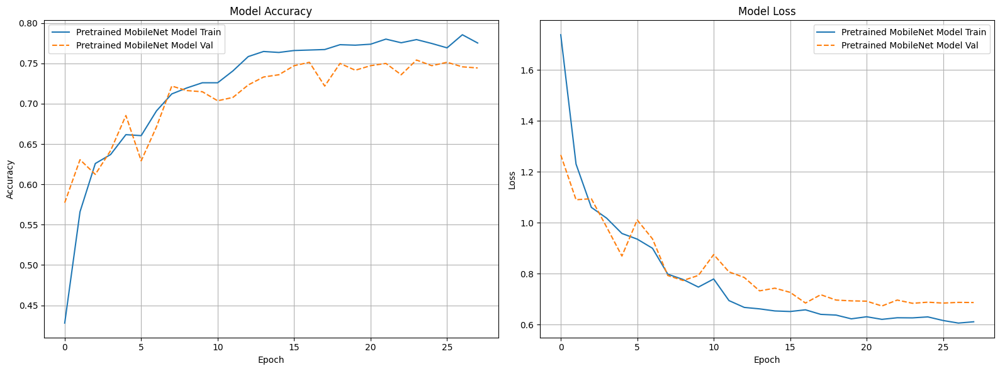

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Pretrained MobileNet Model": history_AP1_mobilenet.history if 'history_AP1_mobilenet' in globals() else None,
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


# Approach 2 - Keeping grayscale images in the training set and NOT CHANGING THEM TO RGB - instead changing all images to greyscale (96,96,1)






In [ ]:
# Parameters
IMG_SIZE = 96
DATASET_DIR = "train"

# Containers
images = []
labels = []
class_names = sorted([d for d in os.listdir(DATASET_DIR) if os.path.isdir(os.path.join(DATASET_DIR, d))])

# Iterate through class folders and load images
for class_name in class_names:
    class_dir = os.path.join(DATASET_DIR, class_name)
    for filename in os.listdir(class_dir):
        img_path = os.path.join(class_dir, filename)
        try:
            # Open image, convert them to greyscale and resize
            img = Image.open(img_path).convert('L')  # Convert to grayscale
            img = img.resize((IMG_SIZE, IMG_SIZE))
            img_array = img_to_array(img) / 255.0  # Normalize to 0–1
            images.append(img_array)
            labels.append(class_name)
        except Exception as e:
            print(f"Skipping file {img_path}: {e}")

# Convert to numpy arrays
X = np.array(images)
y = np.array(labels)

print("Images loaded and resized")
print(f"Image shape: {X.shape}")
print(f"Unique classes: {len(np.unique(y))}")


Images loaded and resized
Image shape: (4750, 96, 96, 1)
Unique classes: 12


In [ ]:
# Create label-to-index mapping
label_to_index = {label: idx for idx, label in enumerate(np.unique(y))}
index_to_label = {idx: label for label, idx in label_to_index.items()}

# Encode string labels to integer indices
y_encoded = np.array([label_to_index[label] for label in y])

# One-hot encode labels
y_categorical = to_categorical(y_encoded, num_classes=len(label_to_index))

# Split 1: train and test1 (70% / 30%)
X_train, X_test1, y_train, y_test1 = train_test_split(
    X, y_categorical, test_size=0.30, stratify=y_categorical, random_state=42
)

# Split 2: test1 into val and test (50%/50% of 30% => 15%/15%)
X_val, X_test, y_val, y_test = train_test_split(
    X_test1, y_test1, test_size=0.50, stratify=y_test1, random_state=42
)


print("Labels encoded and data split finished.")
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_val shape:   {X_val.shape}")
print(f"y_val shape:   {y_val.shape}")
print(f"X_test shape:  {X_test.shape}")
print(f"y_test shape:  {y_test.shape}")


Labels encoded and data split finished.
X_train shape: (3325, 96, 96, 1)
y_train shape: (3325, 12)
X_val shape:   (712, 96, 96, 1)
y_val shape:   (712, 12)
X_test shape:  (713, 96, 96, 1)
y_test shape:  (713, 12)


In [ ]:
def preprocess_images_grayscale(X):
    preprocessed = []
    for img in X:
        # 1. Convert to uint8 (0–255 range)
        img_uint8 = (img * 255).astype(np.uint8)  # shape: (96, 96, 1)

        # 2. Remove channel dimension if needed (from (96, 96, 1) to (96, 96))
        img_gray = img_uint8.squeeze()

        # 3. Apply Gaussian Blur to reduce noise
        blurred = cv2.GaussianBlur(img_gray, (3, 3), 0)

        # 4. (Optional) Contrast enhancement using CLAHE (adaptive histogram equalization)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        enhanced = clahe.apply(blurred)

        # 5. (Optional) Morphological noise removal using closing
        cleaned = cv2.morphologyEx(enhanced, cv2.MORPH_CLOSE, kernel)

        # 6. Rescale to [0–1] and restore channel dimension
        final_img = (cleaned.astype(np.float32) / 255.0)[..., np.newaxis]  # shape: (96, 96, 1)

        preprocessed.append(final_img)

    return np.array(preprocessed)


## Running models with no callbacks to see the performance

In [ ]:
model = build_overfitted_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

history_AP2_overfitted = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - accuracy: 0.4134 - loss: 1.8274 - precision: 0.6050 - recall: 0.2218 - val_accuracy: 0.5857 - val_loss: 1.2307 - val_precision: 0.6674 - val_recall: 0.4143
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - accuracy: 0.8770 - loss: 0.4183 - precision: 0.9114 - recall: 0.8293 - val_accuracy: 0.6292 - val_loss: 1.2527 - val_precision: 0.6810 - val_recall: 0.5576
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - accuracy: 0.9947 - loss: 0.0267 - precision: 0.9953 - recall: 0.9913 - val_accuracy: 0.6011 - val_loss: 1.7966 - val_precision: 0.6337 - val_recall: 0.5758
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.9964 - loss: 0.0164 - precision: 0.9964 - recall: 0.9963 - val_accuracy: 0.6573 - val_loss: 1.7605 - val_precision: 0.6701 - val_recall: 0.6419
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 1.0000 - loss: 7.2195e-04 - precision: 1.0000 - recall: 1.0000 - val_accuracy: 0.6517 

In [ ]:
results_AP2_overfitted = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.5284 - loss: 3.1751 - precision: 0.5471 - recall: 0.5132


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Accuracy:  0.5063113570213318
Precision:  0.5249621868133545
Recall:  0.48667600750923157


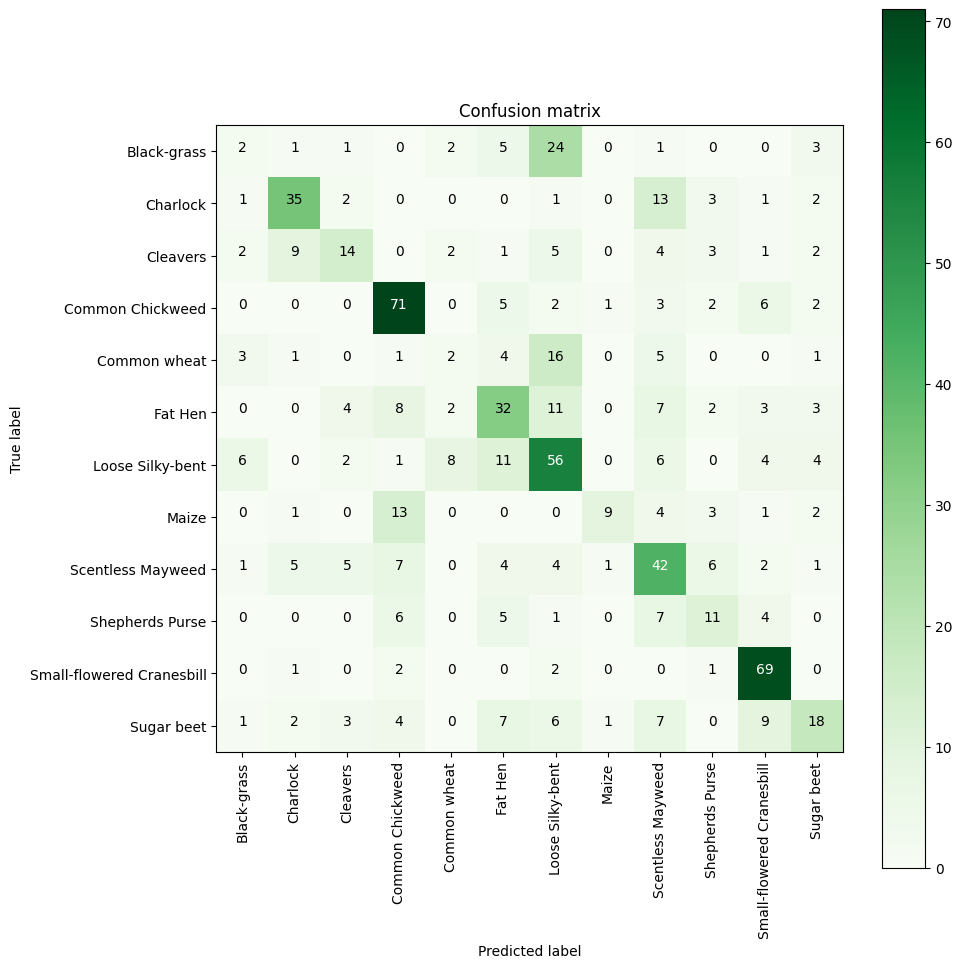

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix computation ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dict to list of labels

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print model metrics ---
print("Accuracy: ", results_AP2_overfitted[1])
print("Precision: ", results_AP2_overfitted[2])
print("Recall: ", results_AP2_overfitted[3])


In [ ]:
model = build_best_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)


history_AP2_better = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    shuffle = True
    )


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 17s 18ms/step - accuracy: 0.3168 - loss: 2.2081 - precision: 0.4245 - recall: 0.1981 - val_accuracy: 0.0843 - val_loss: 5.6822 - val_precision: 0.0859 - val_recall: 0.0829
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5448 - loss: 1.3500 - precision: 0.6519 - recall: 0.4342 - val_accuracy: 0.6419 - val_loss: 1.2069 - val_precision: 0.6931 - val_recall: 0.5899
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.6317 - loss: 1.1050 - precision: 0.7171 - recall: 0.5308 - val_accuracy: 0.4902 - val_loss: 1.7911 - val_precision: 0.5321 - val_recall: 0.4424
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.6725 - loss: 0.9610 - precision: 0.7537 - recall: 0.5824 - val_accuracy: 0.7275 - val_loss: 0.8691 - val_precision: 0.7810 - val_recall: 0.6910
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.7134 - loss: 0.7775 - precision: 0.7802 - recall: 0.6493 - val_accuracy: 0.5618 - val_loss: 

In [ ]:
results_AP2_better = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7774 - loss: 0.8030 - precision: 0.7912 - recall: 0.7629


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Accuracy:  0.8050490617752075
Precision:  0.8219971060752869
Recall:  0.7966339588165283


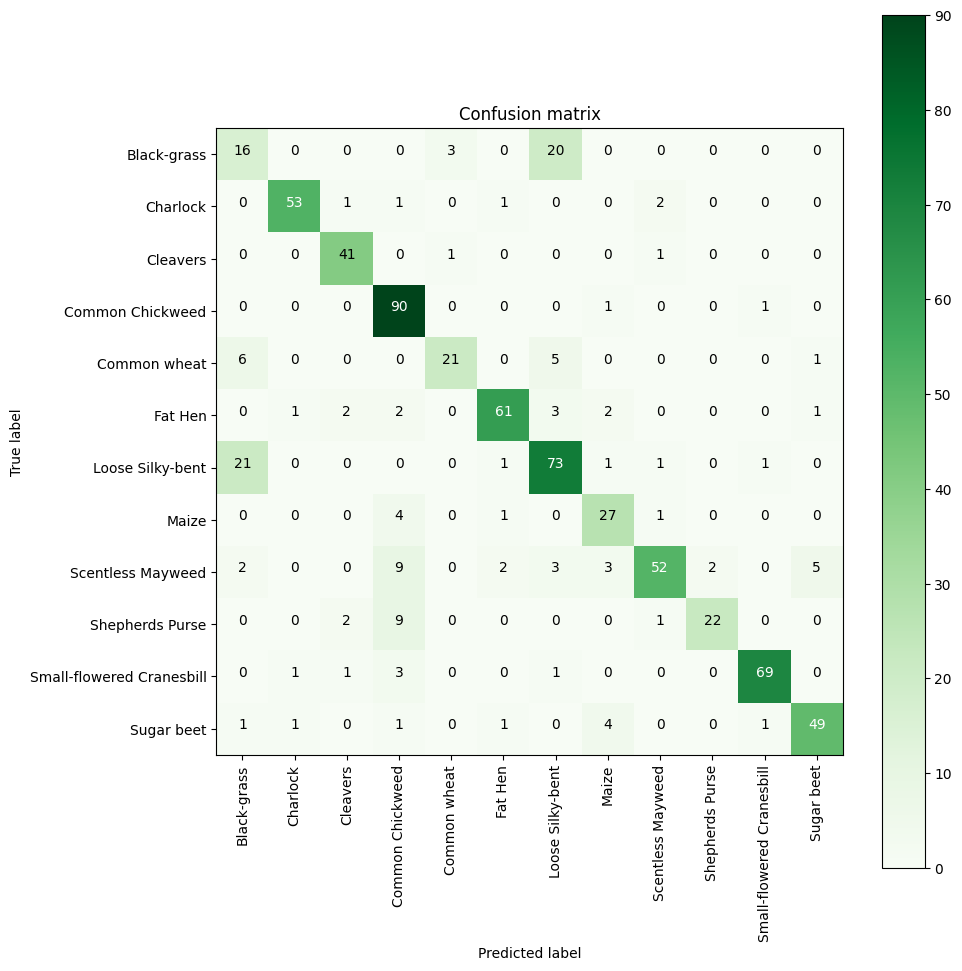

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix (Confusion Matrix) ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (from your index_to_label) ---
categ = list(index_to_label.values())   # Convert dict to a list of labels

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print performance metrics ---
print("Accuracy: ", results_AP2_better[1])
print("Precision: ", results_AP2_better[2])
print("Recall: ", results_AP2_better[3])


## Model comparison - approach 2, no callbacks

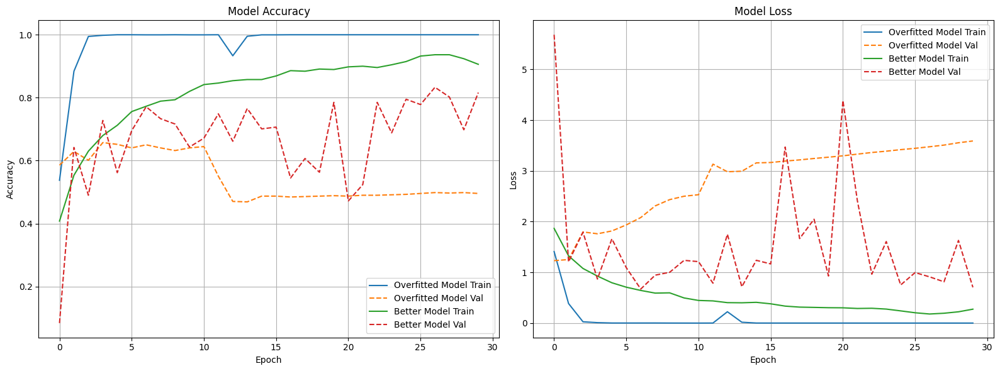

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model": history_AP2_overfitted.history if 'history_AP2_overfitted' in globals() else None,
    "Better Model": history_AP2_better.history if 'history_AP2_better' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Running models with callbacks

In [ ]:
model = build_overfitted_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

history_AP2_overfitted_with_callbacks = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    callbacks = callbacks
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - accuracy: 0.3738 - loss: 1.9012 - precision: 0.5930 - recall: 0.1827 - val_accuracy: 0.6784 - val_loss: 0.9390 - val_precision: 0.7904 - val_recall: 0.5562 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.8639 - loss: 0.4344 - precision: 0.8938 - recall: 0.8208 - val_accuracy: 0.6320 - val_loss: 1.1838 - val_precision: 0.6964 - val_recall: 0.5702 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - accuracy: 0.9964 - loss: 0.0279 - precision: 0.9973 - recall: 0.9957 - val_accuracy: 0.6320 - val_loss: 1.5139 - val_precision: 0.6632 - val_recall: 0.6194 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - accuracy: 0.9990 - loss: 0.0088 - precision: 0.9995 - recall: 0.9989 - val_accuracy: 0.6643 - val_loss: 1.5673 - val_precision: 0.6789 - val_recall: 0.6475 - learning_rate: 5.0000e-04
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/ste

In [ ]:
results_AP2_overfitted_with_callbacks = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.6763 - loss: 0.9232 - precision: 0.8103 - recall: 0.5725


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Accuracy:  0.6942496299743652
Precision:  0.818913459777832
Recall:  0.5708274841308594


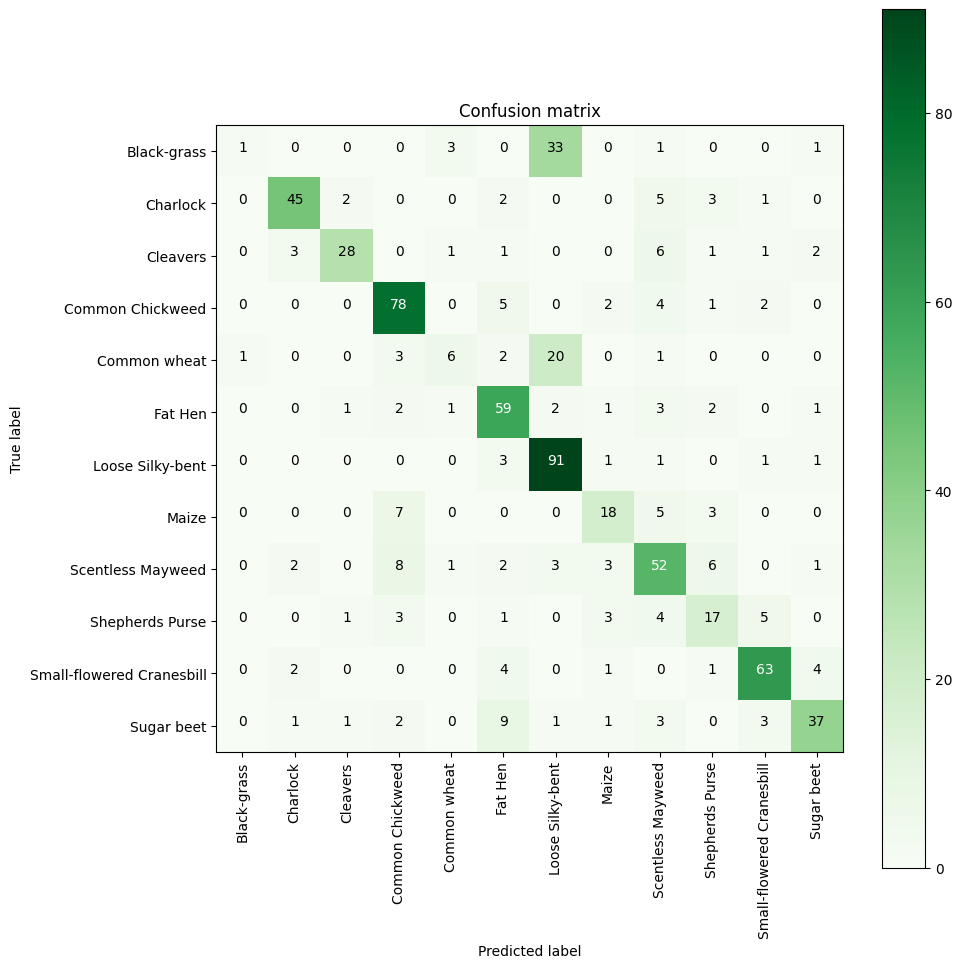

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dictionary to a list of names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Displaying metrics ---
print("Accuracy: ", results_AP2_overfitted_with_callbacks[1])
print("Precision: ", results_AP2_overfitted_with_callbacks[2])
print("Recall: ", results_AP2_overfitted_with_callbacks[3])

In [ ]:
model = build_best_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

history_AP2_better_with_callbacks = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    shuffle = True,
    callbacks = callbacks
    )


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 18ms/step - accuracy: 0.3015 - loss: 2.3635 - precision: 0.3833 - recall: 0.1734 - val_accuracy: 0.0857 - val_loss: 9.8321 - val_precision: 0.0844 - val_recall: 0.0843 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - accuracy: 0.5110 - loss: 1.4414 - precision: 0.6229 - recall: 0.3911 - val_accuracy: 0.5997 - val_loss: 1.0758 - val_precision: 0.6906 - val_recall: 0.5140 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.6042 - loss: 1.1774 - precision: 0.6899 - recall: 0.4693 - val_accuracy: 0.7163 - val_loss: 0.8670 - val_precision: 0.7701 - val_recall: 0.6587 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6463 - loss: 1.0059 - precision: 0.7343 - recall: 0.5628 - val_accuracy: 0.6039 - val_loss: 1.5620 - val_precision: 0.6372 - val_recall: 0.5576 - learning_rate: 0.0010
Epoch 5/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accurac

In [ ]:
results_AP2_better_with_callbacks = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.8272 - loss: 0.5831 - precision: 0.8505 - recall: 0.8171


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step
Accuracy:  0.8302945494651794
Precision:  0.8560940027236938
Recall:  0.8176718354225159


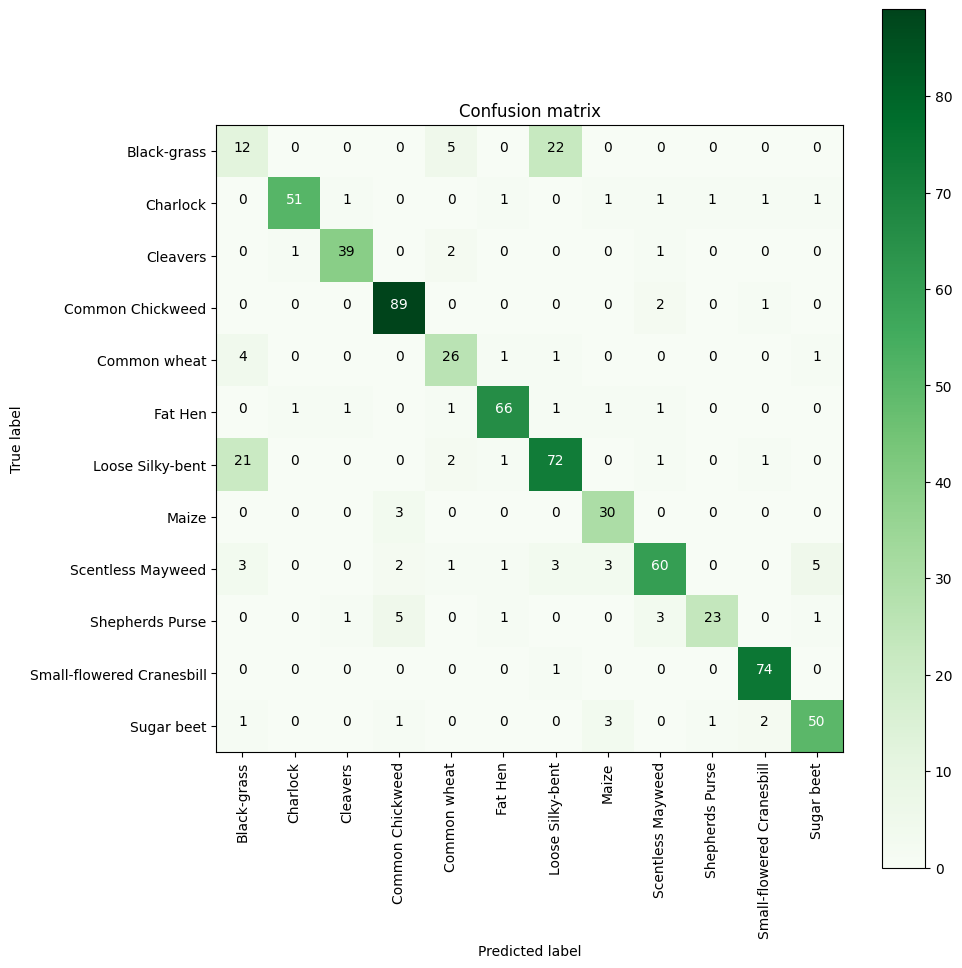

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dictionary to list of names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Display performance metrics ---
print("Accuracy: ", results_AP2_better_with_callbacks[1])
print("Precision: ", results_AP2_better_with_callbacks[2])
print("Recall: ", results_AP2_better_with_callbacks[3])


## Model comparison - approach 2, with callbacks

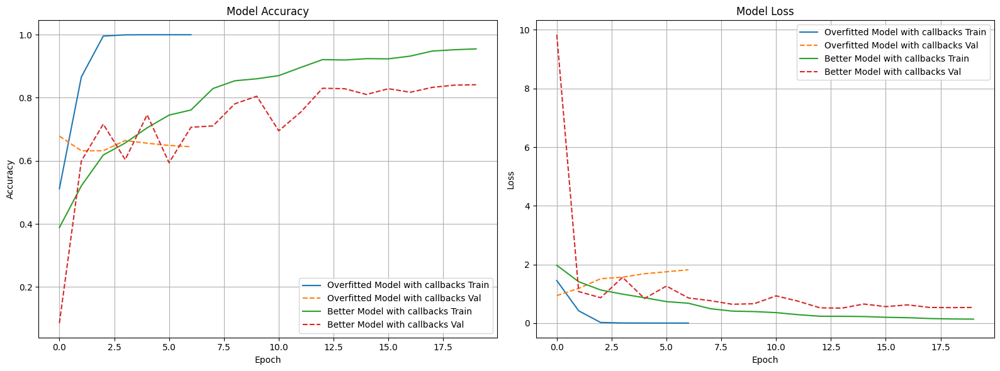

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model with callbacks": history_AP2_overfitted_with_callbacks.history if 'history_AP2_overfitted_with_callbacks' in globals() else None,
    "Better Model with callbacks": history_AP2_better_with_callbacks.history if 'history_AP2_better_with_callbacks' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Adding data-augmentation and running models with it

In [ ]:
# Build the best model (architecture stays the same – data will be augmented)
model = build_overfitted_model()  # you don't need a separate "build_augmented_best_model"

# Compile the model with optimizer, loss function and metrics
model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Define callbacks for learning rate adjustment and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Create data generator with real-time augmentation
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model using the generator
history_AP2_overfitted_augmented = model.fit(
    train_gen,                                    # training data with augmentation
    validation_data=(X_val_cleaned, y_val),       # static validation set
    epochs=30,
    shuffle=True,
    callbacks=callbacks
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 19s 39ms/step - accuracy: 0.2902 - loss: 2.1804 - precision_12: 0.4786 - recall_12: 0.0819 - val_accuracy: 0.4846 - val_loss: 1.4565 - val_precision_12: 0.7325 - val_recall_12: 0.2346 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - accuracy: 0.4548 - loss: 1.5273 - precision_12: 0.6428 - recall_12: 0.2114 - val_accuracy: 0.5267 - val_loss: 1.3150 - val_precision_12: 0.6692 - val_recall_12: 0.3750 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - accuracy: 0.5749 - loss: 1.2253 - precision_12: 0.7100 - recall_12: 0.4045 - val_accuracy: 0.6334 - val_loss: 0.9840 - val_precision_12: 0.7417 - val_recall_12: 0.5365 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 29s 57ms/step - accuracy: 0.6661 - loss: 0.9691 - precision_12: 0.7577 - recall_12: 0.5803 - val_accuracy: 0.6952 - val_loss: 0.8694 - val_precision_12: 0.7761 - val_recall_12: 0.6376 - learning_rate: 0.0010
Epoch 5/

In [ ]:
results_AP2_overfitted_augmented = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8109 - loss: 0.5674 - precision_12: 0.8488 - recall_12: 0.7884


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Accuracy:  0.8148667812347412
Precision:  0.8509036302566528
Recall:  0.792426347732544


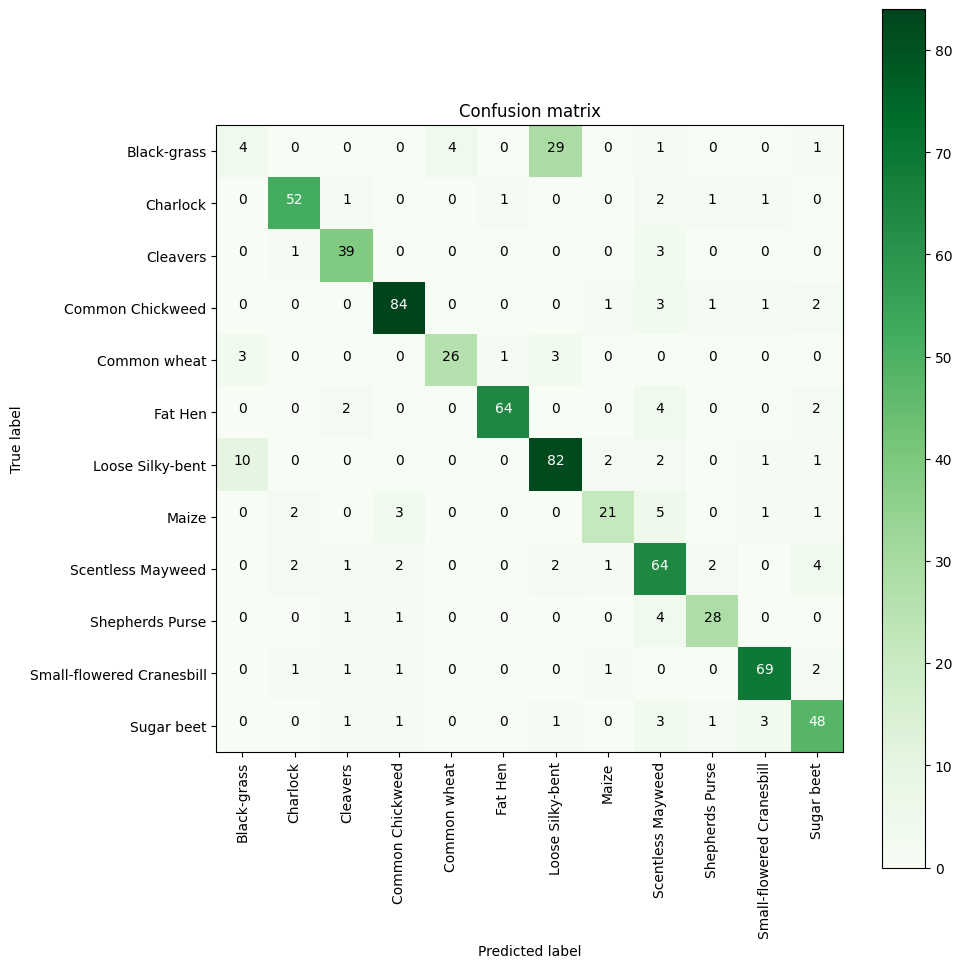

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dictionary to a list of names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Display performance metrics ---
print("Accuracy: ", results_AP2_overfitted_augmented[1])
print("Precision: ", results_AP2_overfitted_augmented[2])
print("Recall: ", results_AP2_overfitted_augmented[3])


In [ ]:
# Build the best model (architecture stays the same – data will be augmented)
model = build_best_model()  # you don't need a separate "build_augmented_best_model"

# Compile the model with optimizer, loss function and metrics
model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Define callbacks for learning rate adjustment and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Create data generator with real-time augmentation
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model using the generator
history_AP2_better_augmented = model.fit(
    train_gen,                                    # training data with augmentation
    validation_data=(X_val_cleaned, y_val),       # static validation set
    epochs=30,
    shuffle=True,
    callbacks=callbacks
)


Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step - accuracy: 0.2752 - loss: 2.3816 - precision_13: 0.3927 - recall_13: 0.1563 - val_accuracy: 0.0604 - val_loss: 8.6097 - val_precision_13: 0.0606 - val_recall_13: 0.0604 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.4689 - loss: 1.6222 - precision_13: 0.5736 - recall_13: 0.3188 - val_accuracy: 0.5421 - val_loss: 1.6917 - val_precision_13: 0.5947 - val_recall_13: 0.5070 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - accuracy: 0.5701 - loss: 1.2965 - precision_13: 0.6633 - recall_13: 0.4359 - val_accuracy: 0.5927 - val_loss: 1.5601 - val_precision_13: 0.6330 - val_recall_13: 0.5449 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - accuracy: 0.5889 - loss: 1.2149 - precision_13: 0.6973 - recall_13: 0.4651 - val_accuracy: 0.6039 - val_loss: 1.2136 - val_precision_13: 0.6847 - val_recall_13: 0.5337 - learning_rate: 0.0010
Epoch 5/

In [ ]:
results_AP2_better_augmented = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.8679 - loss: 0.3879 - precision_13: 0.8784 - recall_13: 0.8529


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
Accuracy:  0.8765778541564941
Precision:  0.8890489935874939
Recall:  0.8653576374053955


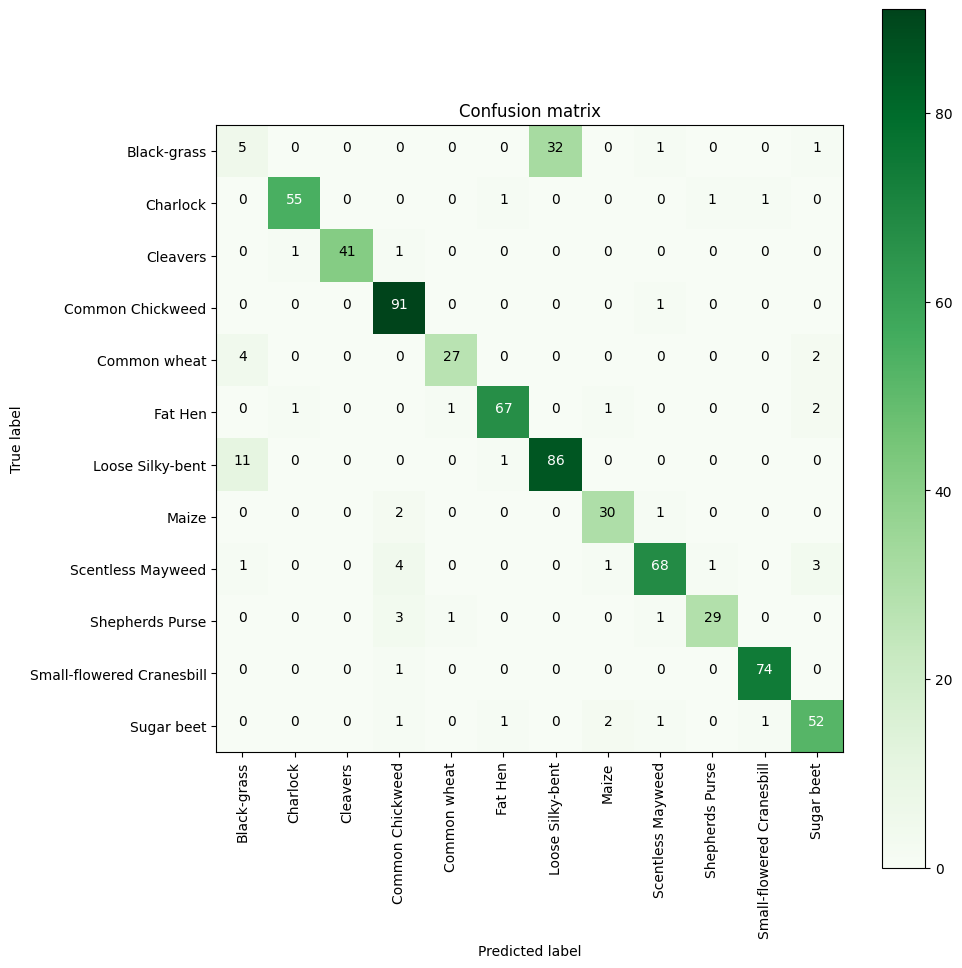

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dict to a list of class names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Displaying model performance metrics ---
print("Accuracy: ", results_AP2_better_augmented[1])
print("Precision: ", results_AP2_better_augmented[2])
print("Recall: ", results_AP2_better_augmented[3])


## Model comparison - approach 2, with callbacks and data augmentation

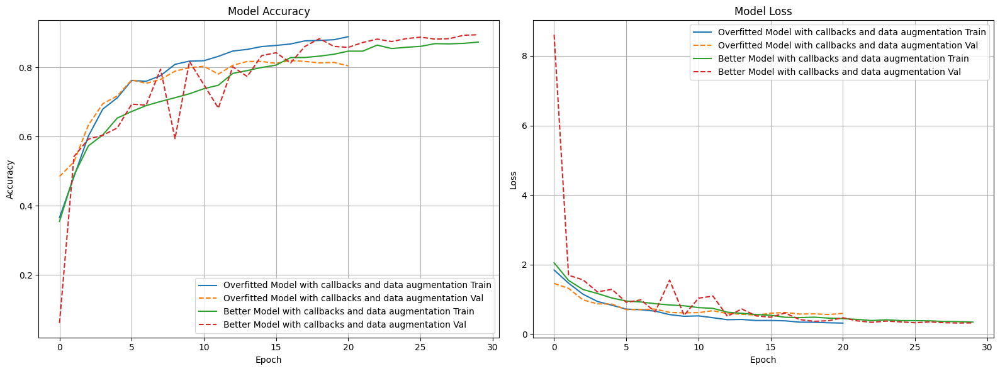

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model with callbacks and data augmentation": history_AP2_overfitted_augmented.history if 'history_AP2_overfitted_augmented' in globals() else None,
    "Better Model with callbacks and data augmentation": history_AP2_better_augmented.history if 'history_AP2_better_augmented' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Running the pre-trained MobileNet model

In [ ]:
model = build_mobilenet_model(input_shape=ins, num_classes=12)

model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Augmented data generator
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model
history_AP2_mobilenet = model.fit(
    train_gen,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    callbacks=callbacks
)

Epoch 1/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - accuracy: 0.3510 - loss: 2.1563 - precision_14: 0.4991 - recall_14: 0.1751 - val_accuracy: 0.5927 - val_loss: 1.1814 - val_precision_14: 0.7291 - val_recall_14: 0.4157 - learning_rate: 0.0010
Epoch 2/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - accuracy: 0.5283 - loss: 1.2815 - precision_14: 0.6692 - recall_14: 0.3796 - val_accuracy: 0.5323 - val_loss: 1.3844 - val_precision_14: 0.6111 - val_recall_14: 0.4171 - learning_rate: 0.0010
Epoch 3/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.6009 - loss: 1.1275 - precision_14: 0.7080 - recall_14: 0.4751 - val_accuracy: 0.6770 - val_loss: 0.9407 - val_precision_14: 0.7597 - val_recall_14: 0.5772 - learning_rate: 0.0010
Epoch 4/30
416/416 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - accuracy: 0.6369 - loss: 1.0044 - precision_14: 0.7281 - recall_14: 0.5098 - val_accuracy: 0.6222 - val_loss: 1.0142 - val_precision_14: 0.7400 - val_recall_14: 0.5197 - learning_rate: 0.0010
Epoch 5/

In [ ]:
results_AP2_mobilenet = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - accuracy: 0.7695 - loss: 0.7566 - precision_14: 0.8265 - recall_14: 0.7053


## Results of pre-trained model

23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step
Accuracy:  0.7671809196472168
Precision:  0.826797366142273
Recall:  0.7096773982048035


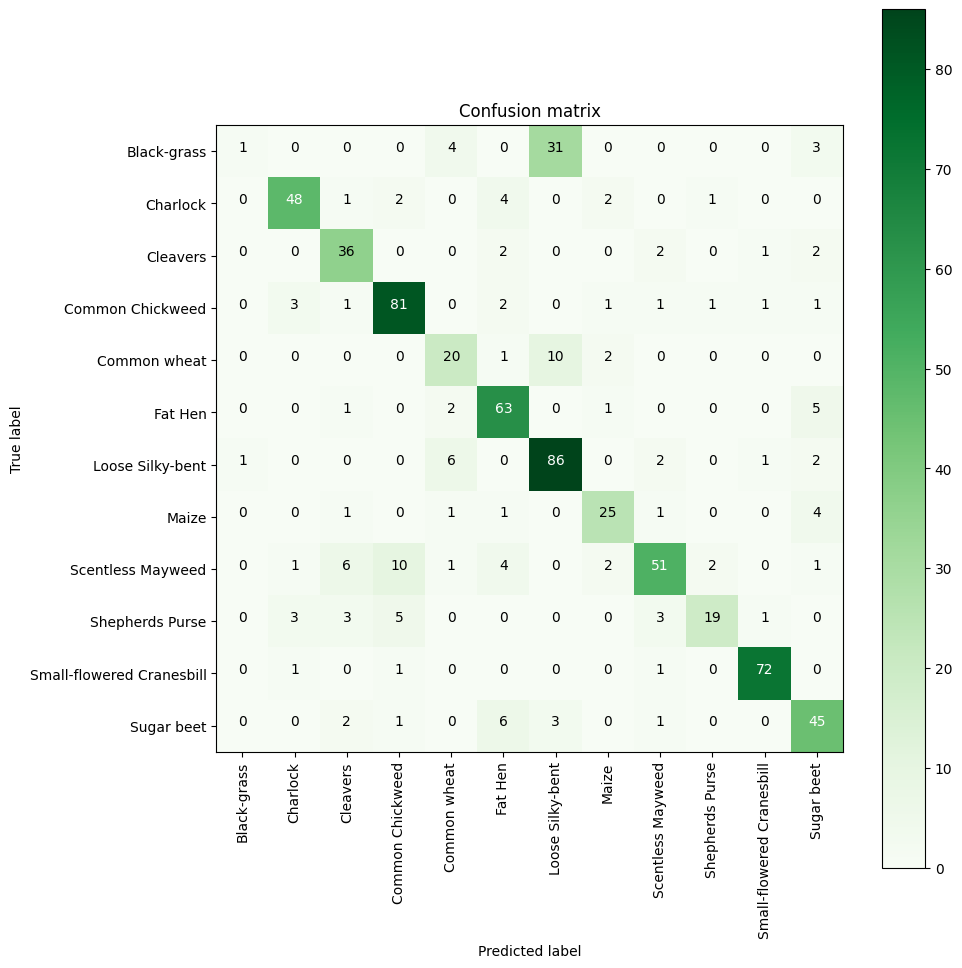

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dictionary to list of class names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Display model performance metrics ---
print("Accuracy: ", results_AP2_mobilenet[1])
print("Precision: ", results_AP2_mobilenet[2])
print("Recall: ", results_AP2_mobilenet[3])


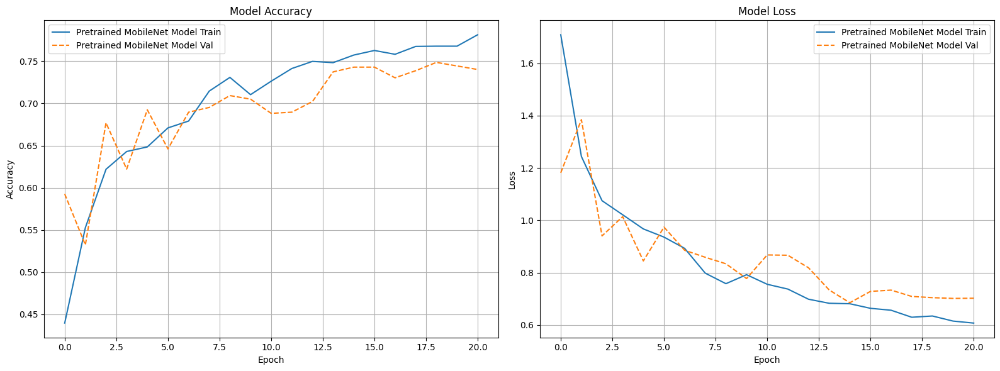

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Pretrained MobileNet Model": history_AP2_mobilenet.history if 'history_AP2_mobilenet' in globals() else None,
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


# Approach 3 - Deleting grayscale images






In [ ]:
# List of known grayscale or unreadable image paths
bad_images = [
    "train/Black-grass/ae8f69724.png",
    "train/Black-grass/77629b9e3.png",
    "train/Black-grass/a8ab1ff26.png",
    "train/Loose Silky-bent/e513efb9a.png",
    "train/Loose Silky-bent/875ef92d7.png",
    "train/Loose Silky-bent/4a0df8be4.png",
    "train/Loose Silky-bent/df615189b.png",
    "train/Loose Silky-bent/ab47c78db.png",
    "train/Loose Silky-bent/881498f15.png",
    "train/Loose Silky-bent/b81690ccf.png",
    "train/Loose Silky-bent/d1653b4c3.png",
    "train/Loose Silky-bent/3fd2b83fc.png",
    "train/Loose Silky-bent/180a7bc07.png",
    "train/Loose Silky-bent/f5602e151.png",
    "train/Loose Silky-bent/3d9f8222d.png",
    "train/Loose Silky-bent/7a8370ede.png",
    "train/Loose Silky-bent/780b7ab63.png",
    "train/Loose Silky-bent/9cf880bda.png",
    "train/Loose Silky-bent/0cf9eb4ab.png",
    "train/Loose Silky-bent/5cb45767e.png",
    "train/Loose Silky-bent/ae1c97a42.png",
    "train/Loose Silky-bent/7324d3cc4.png",
    "train/Loose Silky-bent/02b15993e.png",
    "train/Loose Silky-bent/d31724b7f.png",
]

# Delete each file if it exists
for file_path in bad_images:
    if os.path.exists(file_path):
        os.remove(file_path)
        print(f"Deleted: {file_path}")
    else:
        print(f"Not found: {file_path}")


Deleted: train/Black-grass/ae8f69724.png
Deleted: train/Black-grass/77629b9e3.png
Deleted: train/Black-grass/a8ab1ff26.png
Deleted: train/Loose Silky-bent/e513efb9a.png
Deleted: train/Loose Silky-bent/875ef92d7.png
Deleted: train/Loose Silky-bent/4a0df8be4.png
Deleted: train/Loose Silky-bent/df615189b.png
Deleted: train/Loose Silky-bent/ab47c78db.png
Deleted: train/Loose Silky-bent/881498f15.png
Deleted: train/Loose Silky-bent/b81690ccf.png
Deleted: train/Loose Silky-bent/d1653b4c3.png
Deleted: train/Loose Silky-bent/3fd2b83fc.png
Deleted: train/Loose Silky-bent/180a7bc07.png
Deleted: train/Loose Silky-bent/f5602e151.png
Deleted: train/Loose Silky-bent/3d9f8222d.png
Deleted: train/Loose Silky-bent/7a8370ede.png
Deleted: train/Loose Silky-bent/780b7ab63.png
Deleted: train/Loose Silky-bent/9cf880bda.png
Deleted: train/Loose Silky-bent/0cf9eb4ab.png
Deleted: train/Loose Silky-bent/5cb45767e.png
Deleted: train/Loose Silky-bent/ae1c97a42.png
Deleted: train/Loose Silky-bent/7324d3cc4.png
Del

In [ ]:
# Parameters
IMG_SIZE = 96
DATASET_DIR = "train"

# Containers
images = []
labels = []
class_names = sorted([d for d in os.listdir(DATASET_DIR) if os.path.isdir(os.path.join(DATASET_DIR, d))])

# Iterate through class folders and load images
for class_name in class_names:
    class_dir = os.path.join(DATASET_DIR, class_name)
    for filename in os.listdir(class_dir):
        img_path = os.path.join(class_dir, filename)
        try:
            # Open image, convert to RGB and resize
            img = Image.open(img_path).convert("RGB")
            img = img.resize((IMG_SIZE, IMG_SIZE))
            img_array = img_to_array(img) / 255.0  # Normalize to 0–1
            images.append(img_array)
            labels.append(class_name)
        except Exception as e:
            print(f"Skipping file {img_path}: {e}")

# Convert to numpy arrays
X = np.array(images)
y = np.array(labels)

print("Images loaded and resized")
print(f"Image shape: {X.shape}")
print(f"Unique classes: {len(np.unique(y))}")


Images loaded and resized
Image shape: (4726, 96, 96, 3)
Unique classes: 12


In [ ]:
# Create label-to-index mapping
label_to_index = {label: idx for idx, label in enumerate(np.unique(y))}
index_to_label = {idx: label for label, idx in label_to_index.items()}

# Encode string labels to integer indices
y_encoded = np.array([label_to_index[label] for label in y])

# One-hot encode labels
y_categorical = to_categorical(y_encoded, num_classes=len(label_to_index))

# Split 1: train and test1 (70% / 30%)
X_train, X_test1, y_train, y_test1 = train_test_split(
    X, y_categorical, test_size=0.30, stratify=y_categorical, random_state=42
)

# Split 2: test1 into val and test (50%/50% of 30% => 15%/15%)
X_val, X_test, y_val, y_test = train_test_split(
    X_test1, y_test1, test_size=0.50, stratify=y_test1, random_state=42
)


print("Labels encoded and data split finished.")
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_val shape:   {X_val.shape}")
print(f"y_val shape:   {y_val.shape}")
print(f"X_test shape:  {X_test.shape}")
print(f"y_test shape:  {y_test.shape}")


Labels encoded and data split finished.
X_train shape: (3308, 96, 96, 3)
y_train shape: (3308, 12)
X_val shape:   (709, 96, 96, 3)
y_val shape:   (709, 12)
X_test shape:  (709, 96, 96, 3)
y_test shape:  (709, 12)


In [ ]:
# --- Settings for green segmentation ---
lower_green = (25, 40, 50)
upper_green = (75, 255, 255)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))

# --- Preprocessing function ---
def preprocess_images(X):
    preprocessed = []
    for img in X:
        # 1. Convert to uint8 (0–255)
        img_uint8 = (img * 255).astype(np.uint8)

        # 2. (Optional resize – in your case, images are 224x224, so no resizing)
        resize_img = img_uint8

        # 3. Gaussian blur
        Gblur_img = cv2.GaussianBlur(resize_img, (3, 3), 0)

        # 4. Convert to HSV
        hsv_img = cv2.cvtColor(Gblur_img, cv2.COLOR_RGB2HSV)  # RGB -> HSV

        # 5. Green segmentation
        mask = cv2.inRange(hsv_img, lower_green, upper_green)

        # 6. Morphological cleaning operations
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

        # 7. Boolean mask
        bMask = mask > 0

        # 8. Apply mask to the image
        clearImg = np.zeros_like(resize_img, np.uint8)
        clearImg[bMask] = resize_img[bMask]

        # 9. Convert to float32 (0–1)
        clearImg_float = clearImg.astype(np.float32) / 255.0

        preprocessed.append(clearImg_float)

    return np.asarray(preprocessed)

# --- Preprocess your datasets (example for X_train) ---
X_train_cleaned = preprocess_images(X_train)
X_val_cleaned = preprocess_images(X_val)
X_test_cleaned = preprocess_images(X_test)


## Running models with no callbacks to see the performance

In [ ]:
model = build_overfitted_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

history_AP3_overfitted = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8
)


Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - accuracy: 0.3143 - loss: 2.0543 - precision: 0.5638 - recall: 0.1000 - val_accuracy: 0.4683 - val_loss: 1.4176 - val_precision: 0.7004 - val_recall: 0.2341
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - accuracy: 0.7581 - loss: 0.7327 - precision: 0.8499 - recall: 0.6562 - val_accuracy: 0.5374 - val_loss: 1.5729 - val_precision: 0.5776 - val_recall: 0.4358
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.9926 - loss: 0.0397 - precision: 0.9935 - recall: 0.9916 - val_accuracy: 0.5148 - val_loss: 2.4431 - val_precision: 0.5436 - val_recall: 0.4922
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.9998 - loss: 0.0021 - precision: 1.0000 - recall: 0.9998 - val_accuracy: 0.5275 - val_loss: 2.6786 - val_precision: 0.5508 - val_recall: 0.5049
Epoch 5/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.9997 - loss: 0.0029 - precision: 0.9997 - recall: 0.9993 - val_accuracy: 0.5176 - va

In [ ]:
results_AP3_overfitted = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4381 - loss: 4.8263 - precision: 0.4444 - recall: 0.4319


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
Accuracy:  0.44287729263305664
Precision:  0.44933921098709106
Recall:  0.43159380555152893


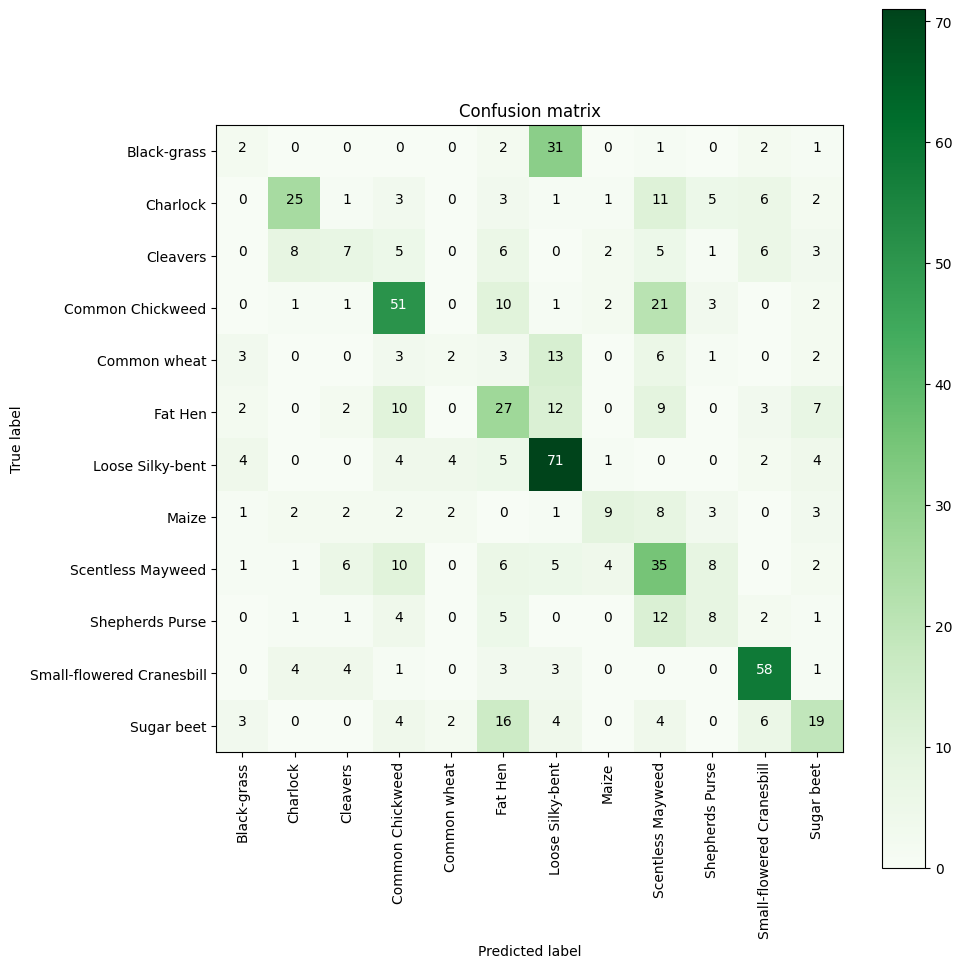

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dictionary to list of class names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Displaying model performance metrics ---
print("Accuracy: ", results_AP3_overfitted[1])
print("Precision: ", results_AP3_overfitted[2])
print("Recall: ", results_AP3_overfitted[3])


In [ ]:
model = build_best_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)


history_AP3_better = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    shuffle = True
    )


Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - accuracy: 0.3024 - loss: 2.3578 - precision: 0.3978 - recall: 0.1721 - val_accuracy: 0.0606 - val_loss: 10.3246 - val_precision: 0.0606 - val_recall: 0.0606
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5434 - loss: 1.3862 - precision: 0.6356 - recall: 0.4026 - val_accuracy: 0.5769 - val_loss: 1.3648 - val_precision: 0.6393 - val_recall: 0.5275
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6190 - loss: 1.1053 - precision: 0.7137 - recall: 0.5130 - val_accuracy: 0.4626 - val_loss: 2.4187 - val_precision: 0.4875 - val_recall: 0.4386
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.6787 - loss: 0.9220 - precision: 0.7549 - recall: 0.5839 - val_accuracy: 0.7264 - val_loss: 0.8914 - val_precision: 0.7780 - val_recall: 0.6869
Epoch 5/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.7293 - loss: 0.7773 - precision: 0.7920 - recall: 0.6551 - val_accuracy: 0.6728 - val_loss:

In [ ]:
results_AP3_better = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6752 - loss: 1.4734 - precision: 0.6829 - recall: 0.6627


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
Accuracy:  0.6882933974266052
Precision:  0.6982507109642029
Recall:  0.6755994558334351


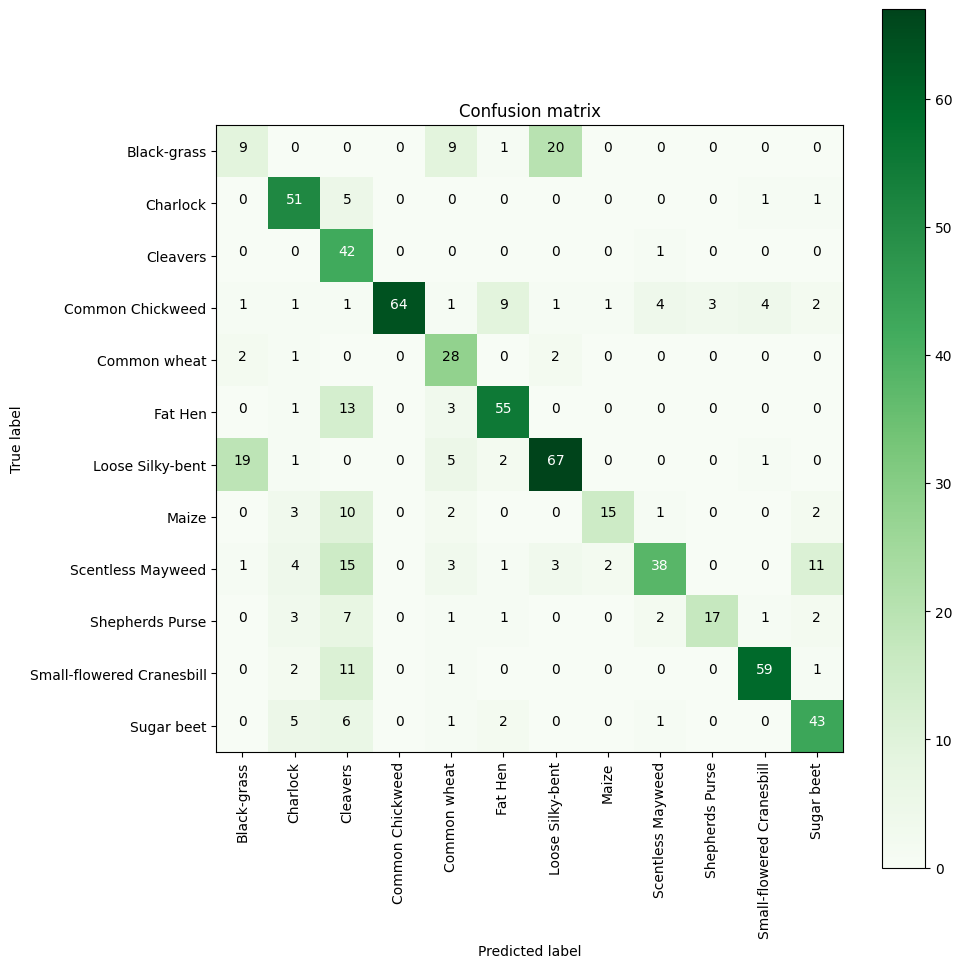

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dictionary to a list of names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Display model performance metrics ---
print("Accuracy: ", results_AP3_better[1])
print("Precision: ", results_AP3_better[2])
print("Recall: ", results_AP3_better[3])


## Model comparison - approach 3, no callbacks

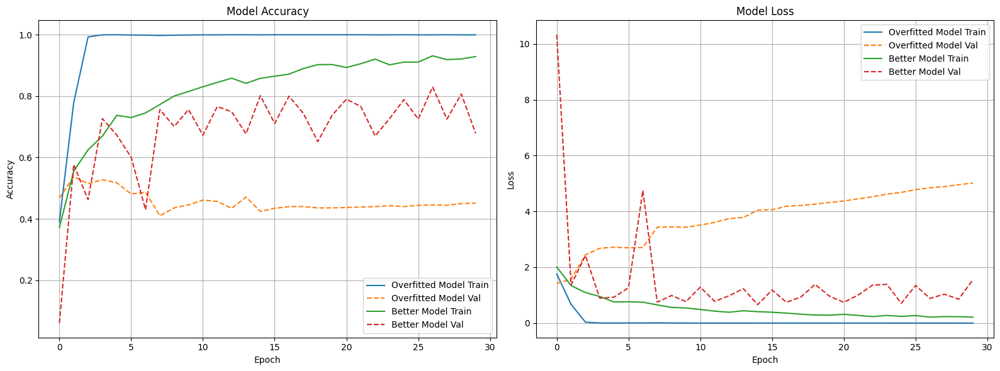

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model": history_AP3_overfitted.history if 'history_AP3_overfitted' in globals() else None,
    "Better Model": history_AP3_better.history if 'history_AP3_better' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Running models with callbacks

In [ ]:
model = build_overfitted_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

history_AP3_overfitted_with_callbacks = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    callbacks = callbacks
)

Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - accuracy: 0.3328 - loss: 2.0731 - precision: 0.5414 - recall: 0.1399 - val_accuracy: 0.6587 - val_loss: 1.0378 - val_precision: 0.7389 - val_recall: 0.5388 - learning_rate: 0.0010
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.7727 - loss: 0.6901 - precision: 0.8336 - recall: 0.6968 - val_accuracy: 0.6389 - val_loss: 1.1302 - val_precision: 0.6729 - val_recall: 0.5599 - learning_rate: 0.0010
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - accuracy: 0.9831 - loss: 0.0811 - precision: 0.9876 - recall: 0.9821 - val_accuracy: 0.6474 - val_loss: 1.6190 - val_precision: 0.6677 - val_recall: 0.6234 - learning_rate: 0.0010
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.9995 - loss: 0.0056 - precision: 0.9995 - recall: 0.9995 - val_accuracy: 0.6657 - val_loss: 1.5377 - val_precision: 0.6979 - val_recall: 0.6516 - learning_rate: 5.0000e-04
Epoch 5/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/ste

In [ ]:
results_AP3_overfitted_with_callbacks = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6465 - loss: 1.0219 - precision: 0.7750 - recall: 0.5330


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Accuracy:  0.6502115726470947
Precision:  0.7681451439857483
Recall:  0.5373765826225281


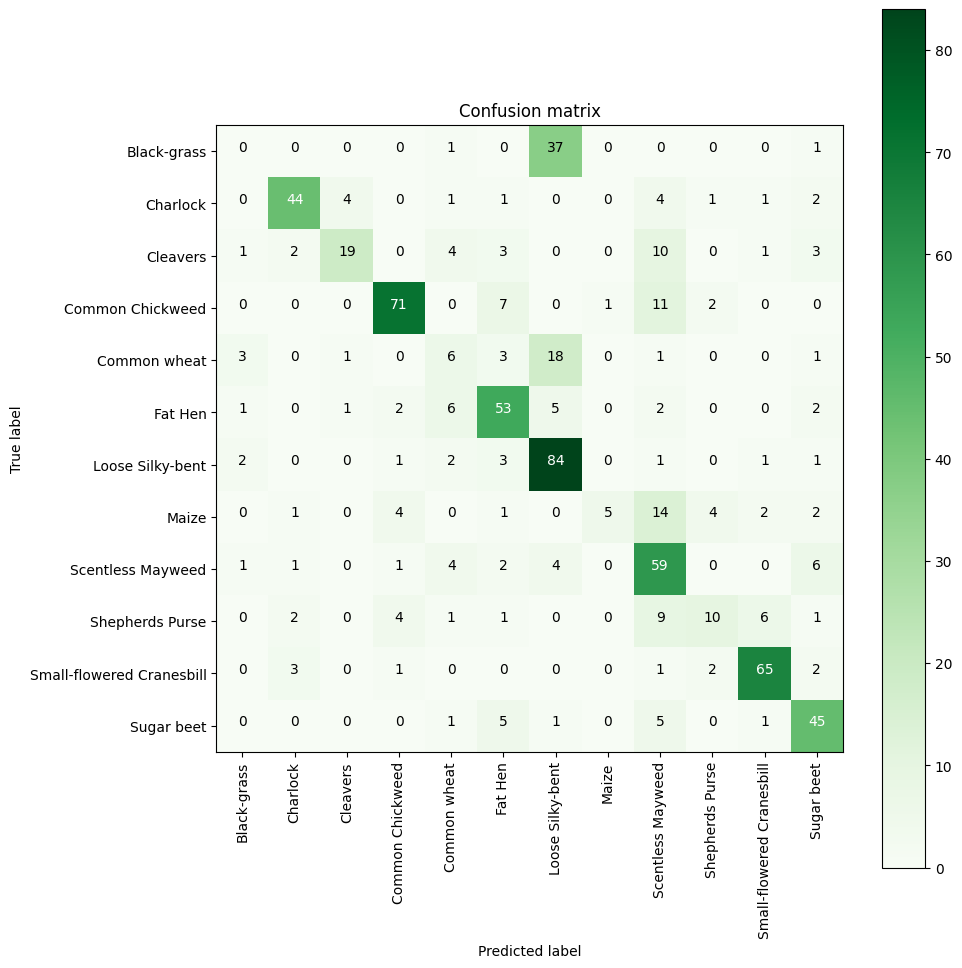

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (from your index_to_label dictionary) ---
categ = list(index_to_label.values())   # Convert dict to a list of class names

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print performance metrics ---
print("Accuracy: ", results_AP3_overfitted_with_callbacks[1])
print("Precision: ", results_AP3_overfitted_with_callbacks[2])
print("Recall: ", results_AP3_overfitted_with_callbacks[3])


In [ ]:
model = build_best_model()

model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'precision', 'recall']
)

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

history_AP3_better_with_callbacks = model.fit(
    X_train_cleaned, y_train,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    batch_size=8,
    shuffle = True,
    callbacks = callbacks
    )


Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - accuracy: 0.3019 - loss: 2.3647 - precision: 0.4237 - recall: 0.1985 - val_accuracy: 0.0874 - val_loss: 6.7576 - val_precision: 0.0877 - val_recall: 0.0874 - learning_rate: 0.0010
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5528 - loss: 1.3492 - precision: 0.6543 - recall: 0.4264 - val_accuracy: 0.6305 - val_loss: 1.2002 - val_precision: 0.6804 - val_recall: 0.5825 - learning_rate: 0.0010
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.6270 - loss: 1.1231 - precision: 0.7165 - recall: 0.5169 - val_accuracy: 0.6671 - val_loss: 0.9903 - val_precision: 0.7527 - val_recall: 0.5924 - learning_rate: 0.0010
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.6753 - loss: 0.9783 - precision: 0.7553 - recall: 0.5893 - val_accuracy: 0.6601 - val_loss: 0.9816 - val_precision: 0.7461 - val_recall: 0.6093 - learning_rate: 0.0010
Epoch 5/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy

In [ ]:
results_AP3_better_with_callbacks = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8279 - loss: 0.5307 - precision: 0.8439 - recall: 0.8181


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step
Accuracy:  0.8406205773353577
Precision:  0.8554744720458984
Recall:  0.8265162110328674


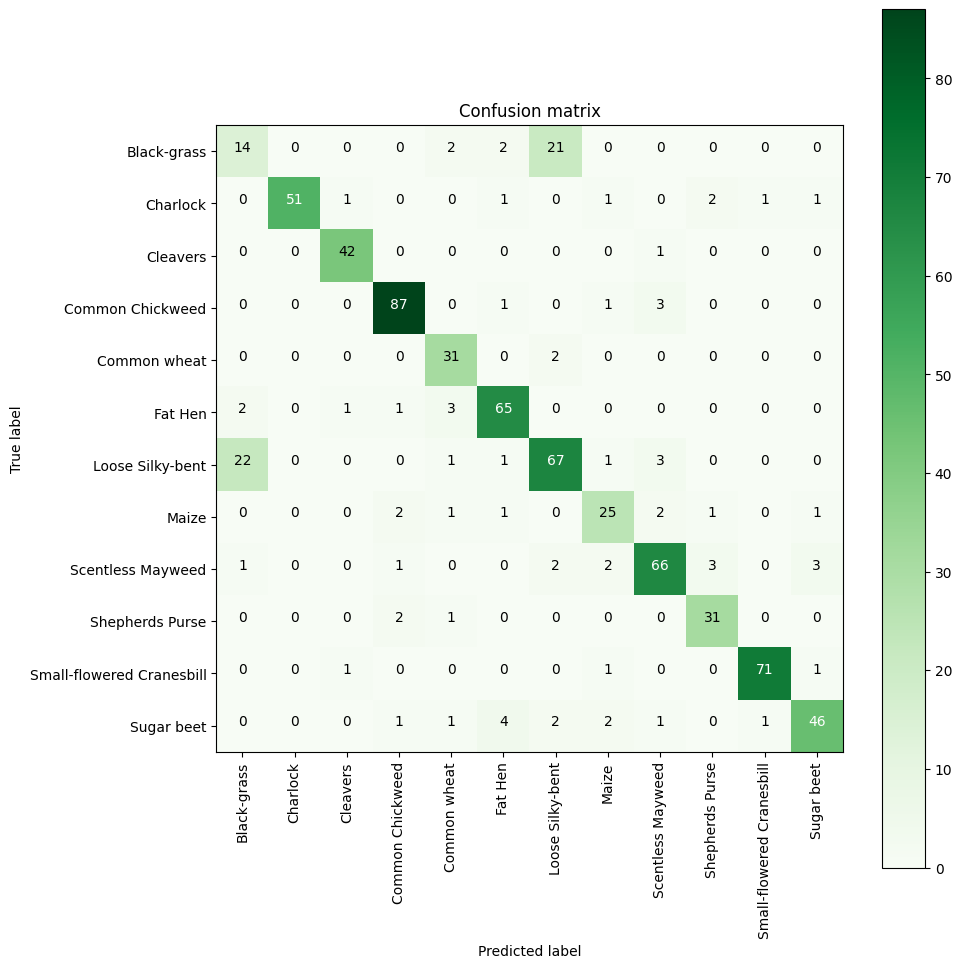

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion Matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (your index_to_label) ---
categ = list(index_to_label.values())   # Convert dict to list of class names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Displaying evaluation metrics ---
print("Accuracy: ", results_AP3_better_with_callbacks[1])
print("Precision: ", results_AP3_better_with_callbacks[2])
print("Recall: ", results_AP3_better_with_callbacks[3])


## Model comparison - approach 3, with callbacks

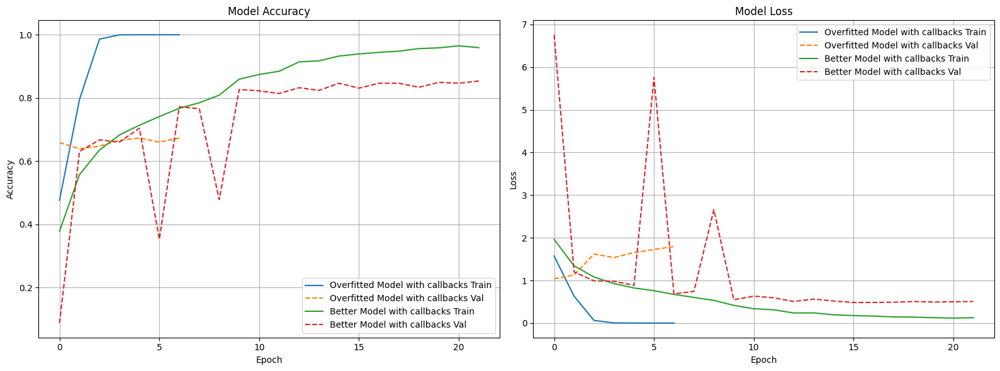

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model with callbacks": history_AP3_overfitted_with_callbacks.history if 'history_AP3_overfitted_with_callbacks' in globals() else None,
    "Better Model with callbacks": history_AP3_better_with_callbacks.history if 'history_AP3_better_with_callbacks' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Adding data-augmentation and running models with it

In [ ]:
# Build the best model (architecture stays the same – data will be augmented)
model = build_overfitted_model()  # you don't need a separate "build_augmented_best_model"

# Compile the model with optimizer, loss function and metrics
model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Define callbacks for learning rate adjustment and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Create data generator with real-time augmentation
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model using the generator
history_AP3_overfitted_augmented = model.fit(
    train_gen,                                    # training data with augmentation
    validation_data=(X_val_cleaned, y_val),       # static validation set
    epochs=30,
    shuffle=True,
    callbacks=callbacks
)


Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step - accuracy: 0.2078 - loss: 2.3874 - precision_19: 0.2729 - recall_19: 0.0225 - val_accuracy: 0.5346 - val_loss: 1.3819 - val_precision_19: 0.7468 - val_recall_19: 0.3286 - learning_rate: 0.0010
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - accuracy: 0.5306 - loss: 1.3799 - precision_19: 0.6944 - recall_19: 0.3317 - val_accuracy: 0.6728 - val_loss: 1.0277 - val_precision_19: 0.7725 - val_recall_19: 0.4838 - learning_rate: 0.0010
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - accuracy: 0.6537 - loss: 1.0487 - precision_19: 0.7552 - recall_19: 0.5111 - val_accuracy: 0.7151 - val_loss: 0.9110 - val_precision_19: 0.7784 - val_recall_19: 0.6192 - learning_rate: 0.0010
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - accuracy: 0.6963 - loss: 0.9296 - precision_19: 0.7882 - recall_19: 0.5989 - val_accuracy: 0.7250 - val_loss: 0.8397 - val_precision_19: 0.7762 - val_recall_19: 0.6361 - learning_rate: 0.0010
Epoch 5/

In [ ]:
results_AP3_overfitted_augmented = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8379 - loss: 0.5666 - precision_19: 0.8570 - recall_19: 0.8184


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Accuracy:  0.8476727604866028
Precision:  0.872592568397522
Recall:  0.8307475447654724


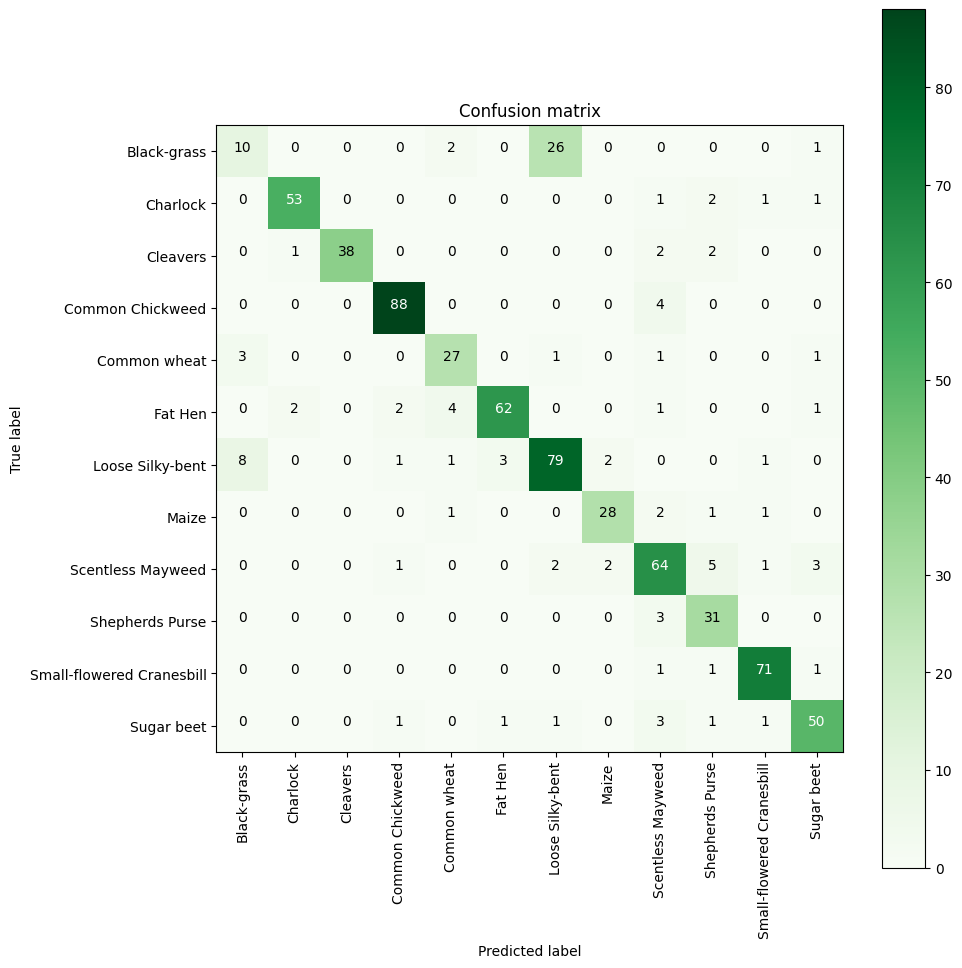

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Get predicted class indices
trueY = np.argmax(y_test, axis=1)         # Get true class indices

# --- Compute the confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class labels (from your index_to_label dictionary) ---
categ = list(index_to_label.values())   # Convert dict to a list of class names

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Display evaluation metrics ---
print("Accuracy: ", results_AP3_overfitted_augmented[1])
print("Precision: ", results_AP3_overfitted_augmented[2])
print("Recall: ", results_AP3_overfitted_augmented[3])


In [ ]:
# Build the best model (architecture stays the same – data will be augmented)
model = build_best_model()  # you don't need a separate "build_augmented_best_model"

# Compile the model with optimizer, loss function and metrics
model.compile(
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Define callbacks for learning rate adjustment and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Create data generator with real-time augmentation
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model using the generator
history_AP3_better_augmented = model.fit(
    train_gen,                                    # training data with augmentation
    validation_data=(X_val_cleaned, y_val),       # static validation set
    epochs=30,
    shuffle=True,
    callbacks=callbacks
)


Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - accuracy: 0.3167 - loss: 2.2918 - precision_20: 0.4153 - recall_20: 0.1927 - val_accuracy: 0.0649 - val_loss: 5.3131 - val_precision_20: 0.0677 - val_recall_20: 0.0635 - learning_rate: 0.0010
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 34s 34ms/step - accuracy: 0.5140 - loss: 1.4818 - precision_20: 0.6246 - recall_20: 0.3849 - val_accuracy: 0.4415 - val_loss: 2.1011 - val_precision_20: 0.4949 - val_recall_20: 0.4090 - learning_rate: 0.0010
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - accuracy: 0.5515 - loss: 1.3192 - precision_20: 0.6563 - recall_20: 0.4332 - val_accuracy: 0.3709 - val_loss: 3.8167 - val_precision_20: 0.3804 - val_recall_20: 0.3456 - learning_rate: 0.0010
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step - accuracy: 0.6240 - loss: 1.0885 - precision_20: 0.7253 - recall_20: 0.5259 - val_accuracy: 0.5811 - val_loss: 1.1888 - val_precision_20: 0.6588 - val_recall_20: 0.5092 - learning_rate: 0.0010
Epoch 5/

In [ ]:
results_AP3_better_augmented = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8759 - loss: 0.3427 - precision_20: 0.8875 - recall_20: 0.8668


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step
Accuracy:  0.8801128268241882
Precision:  0.8942028880119324
Recall:  0.870239794254303


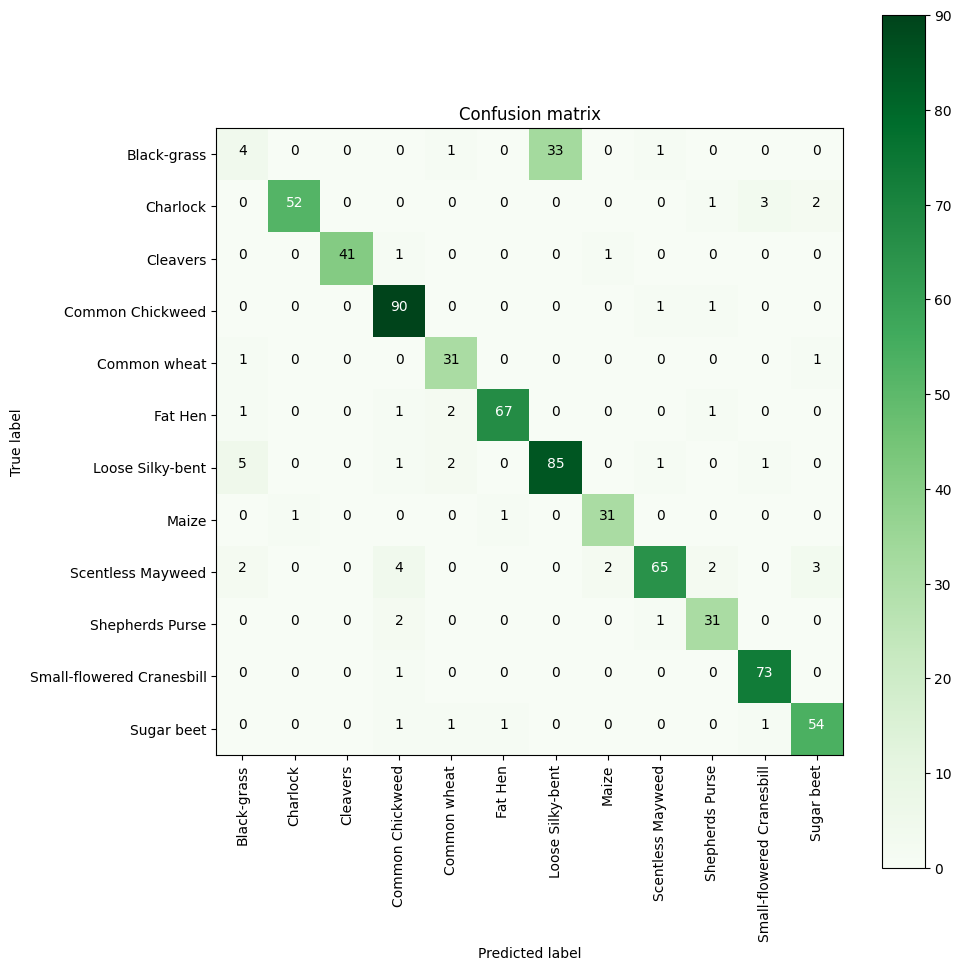

In [ ]:
# --- Function to plot the confusion matrix ---
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Greens):
    fig = plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    # Normalize the confusion matrix if requested
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    # Add text annotations for each cell
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f'{cm[i, j]}',
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class
trueY = np.argmax(y_test, axis=1)         # Extract true class

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (from your index_to_label dictionary) ---
categ = list(index_to_label.values())   # Convert dictionary to a list of class names

# --- Plotting the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Display model performance metrics ---
print("Accuracy: ", results_AP3_better_augmented[1])
print("Precision: ", results_AP3_better_augmented[2])
print("Recall: ", results_AP3_better_augmented[3])


## Model comparison - approach 3, with callbacks and data augmentation

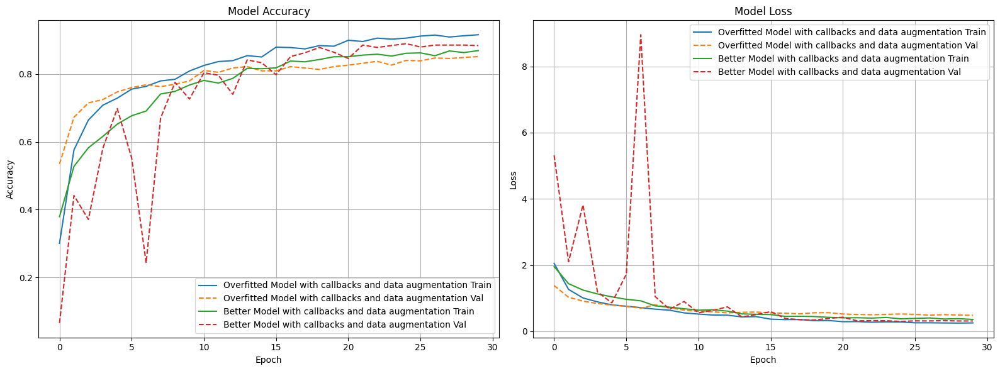

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Overfitted Model with callbacks and data augmentation": history_AP3_overfitted_augmented.history if 'history_AP3_overfitted_augmented' in globals() else None,
    "Better Model with callbacks and data augmentation": history_AP3_better_augmented.history if 'history_AP3_better_augmented' in globals() else None
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## Running the pre-trained MobileNet model

In [ ]:
model = build_mobilenet_model(input_shape=ins, num_classes=12)

model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall()]
)

# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Augmented data generator
train_gen = get_augmented_generator(X_train_cleaned, y_train, batch_size=8)

# Train the model
history_AP3_mobilenet = model.fit(
    train_gen,
    validation_data=(X_val_cleaned, y_val),
    epochs=30,
    callbacks=callbacks
)

Epoch 1/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 30s 52ms/step - accuracy: 0.3520 - loss: 2.1154 - precision_21: 0.5311 - recall_21: 0.1565 - val_accuracy: 0.5233 - val_loss: 1.3681 - val_precision_21: 0.7873 - val_recall_21: 0.2454 - learning_rate: 0.0010
Epoch 2/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 0.5720 - loss: 1.2205 - precision_21: 0.7299 - recall_21: 0.4093 - val_accuracy: 0.6460 - val_loss: 1.0462 - val_precision_21: 0.7694 - val_recall_21: 0.4471 - learning_rate: 0.0010
Epoch 3/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 0.6252 - loss: 1.0936 - precision_21: 0.7345 - recall_21: 0.4902 - val_accuracy: 0.5867 - val_loss: 1.1040 - val_precision_21: 0.7187 - val_recall_21: 0.4288 - learning_rate: 0.0010
Epoch 4/30
414/414 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 0.6454 - loss: 1.0000 - precision_21: 0.7535 - recall_21: 0.5279 - val_accuracy: 0.6544 - val_loss: 0.9793 - val_precision_21: 0.7307 - val_recall_21: 0.5472 - learning_rate: 0.0010
Epoch 5/

In [ ]:
results_AP3_mobilenet = model.evaluate(X_test_cleaned, y_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7757 - loss: 0.6574 - precision_21: 0.8322 - recall_21: 0.7196


## Results of pre-trained model

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Accuracy:  0.7672778367996216
Precision:  0.8232405781745911
Recall:  0.7094499468803406


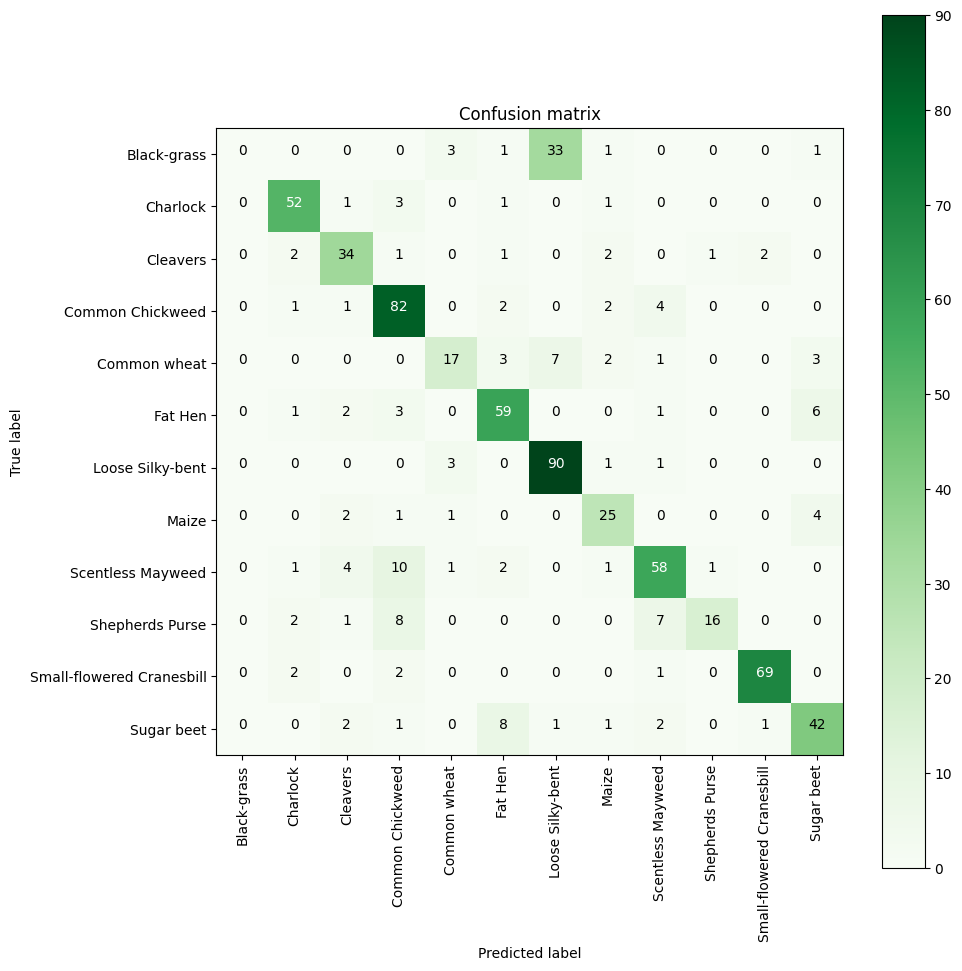

In [ ]:
# --- Model predictions on the test set ---
predY = model.predict(X_test_cleaned)
predYClasses = np.argmax(predY, axis=1)   # Extract predicted class indices
trueY = np.argmax(y_test, axis=1)         # Extract true class indices

# --- Confusion matrix ---
confusionMTX = confusion_matrix(trueY, predYClasses)

# --- List of class names (from your index_to_label dictionary) ---
categ = list(index_to_label.values())   # Convert dictionary to list of class names

# --- Plot the confusion matrix ---
plot_confusion_matrix(confusionMTX, classes=categ, normalize=False)

# --- Print model performance metrics ---
print("Accuracy: ", results_AP3_mobilenet[1])
print("Precision: ", results_AP3_mobilenet[2])
print("Recall: ", results_AP3_mobilenet[3])


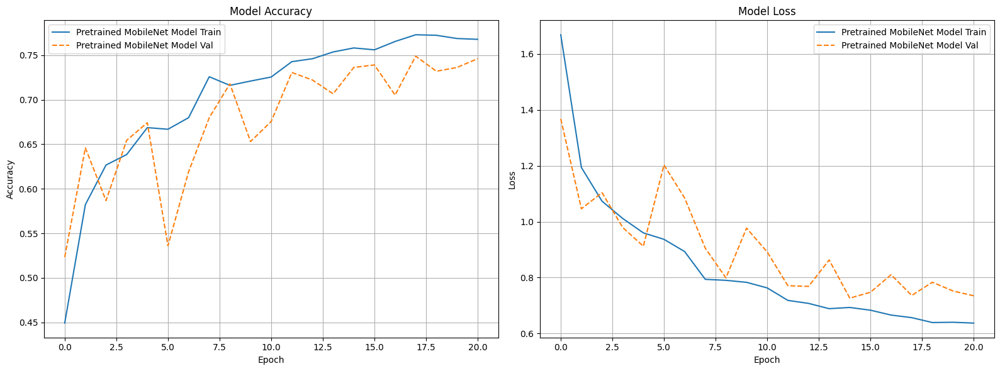

In [ ]:
def extract_metrics(history):
    return (
        history.history['accuracy'],
        history.history['val_accuracy'],
        history.history['loss'],
        history.history['val_loss'],
    )

# Assuming these are available in your session already
histories = {
    "Pretrained MobileNet Model": history_AP3_mobilenet.history if 'history_AP3_mobilenet' in globals() else None,
}

plt.figure(figsize=(16, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
for name, h in histories.items():
    if h:
        plt.plot(h['accuracy'], label=f'{name} Train')
        plt.plot(h['val_accuracy'], linestyle='--', label=f'{name} Val')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
for name, h in histories.items():
    if h:
        plt.plot(h['loss'], label=f'{name} Train')
        plt.plot(h['val_loss'], linestyle='--', label=f'{name} Val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


# Comparing results from different approaches

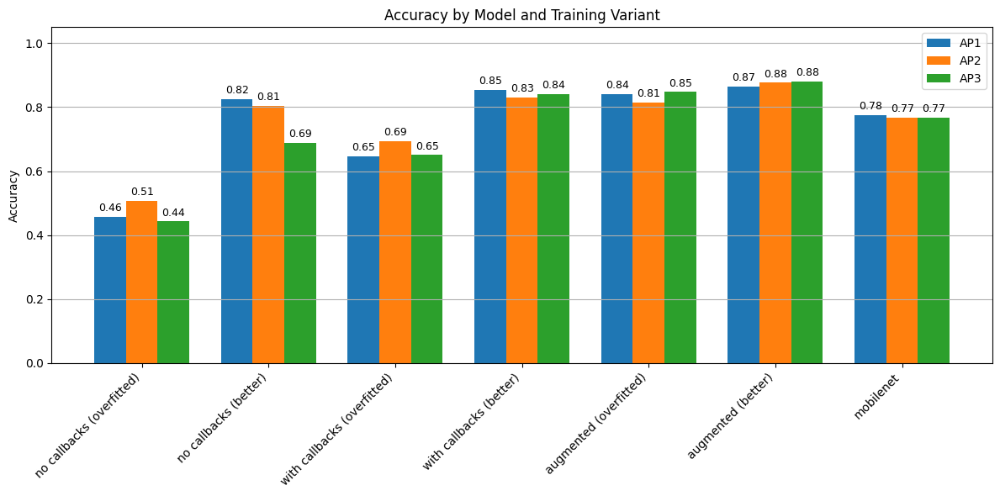

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

labels = [
    'no callbacks (overfitted)',
    'no callbacks (better)',
    'with callbacks (overfitted)',
    'with callbacks (better)',
    'augmented (overfitted)',
    'augmented (better)',
    'mobilenet'
]
x = np.arange(len(labels))
width = 0.25

AP1_acc = [
    results_AP1_overfitted[1],
    results_AP1_better[1],
    results_AP1_overfitted_with_callbacks[1],
    results_AP1_better_with_callbacks[1],
    results_AP1_overfitted_augmented[1],
    results_AP1_better_augmented[1],
    results_AP1_mobilenet[1]
]

AP2_acc = [
    results_AP2_overfitted[1],
    results_AP2_better[1],
    results_AP2_overfitted_with_callbacks[1],
    results_AP2_better_with_callbacks[1],
    results_AP2_overfitted_augmented[1],
    results_AP2_better_augmented[1],
    results_AP2_mobilenet[1]
]

AP3_acc = [
    results_AP3_overfitted[1],
    results_AP3_better[1],
    results_AP3_overfitted_with_callbacks[1],
    results_AP3_better_with_callbacks[1],
    results_AP3_overfitted_augmented[1],
    results_AP3_better_augmented[1],
    results_AP3_mobilenet[1]
]

plt.figure(figsize=(12, 6))

bars1 = plt.bar(x - width, AP1_acc, width, label='AP1')
bars2 = plt.bar(x, AP2_acc, width, label='AP2')
bars3 = plt.bar(x + width, AP3_acc, width, label='AP3')

plt.ylabel('Accuracy')
plt.title('Accuracy by Model and Training Variant')
plt.xticks(x, labels, rotation=45, ha='right')
plt.ylim(0, 1.05)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()

for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.01,
            f'{height:.2f}',
            ha='center',
            va='bottom',
            fontsize=9
        )

plt.show()


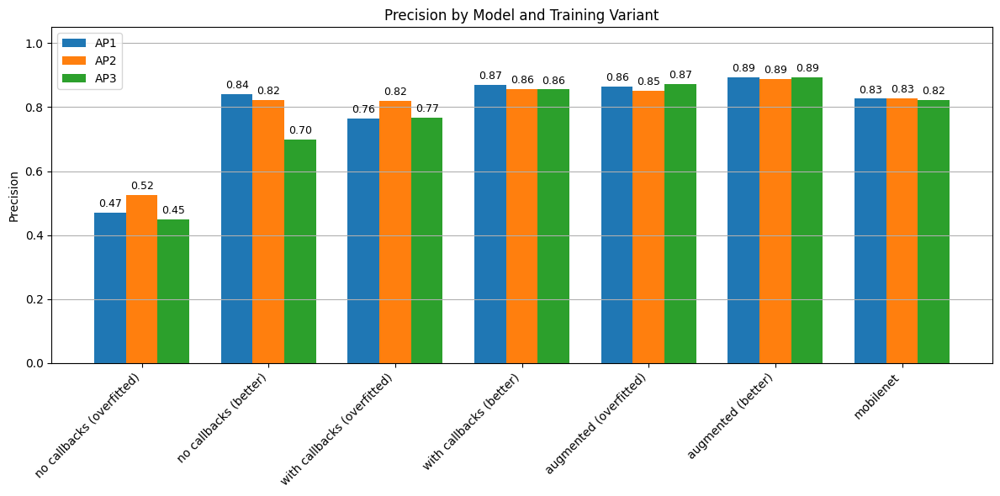

In [ ]:
AP1_prec = [
    results_AP1_overfitted[2],
    results_AP1_better[2],
    results_AP1_overfitted_with_callbacks[2],
    results_AP1_better_with_callbacks[2],
    results_AP1_overfitted_augmented[2],
    results_AP1_better_augmented[2],
    results_AP1_mobilenet[2]
]

AP2_prec = [
    results_AP2_overfitted[2],
    results_AP2_better[2],
    results_AP2_overfitted_with_callbacks[2],
    results_AP2_better_with_callbacks[2],
    results_AP2_overfitted_augmented[2],
    results_AP2_better_augmented[2],
    results_AP2_mobilenet[2]
]

AP3_prec = [
    results_AP3_overfitted[2],
    results_AP3_better[2],
    results_AP3_overfitted_with_callbacks[2],
    results_AP3_better_with_callbacks[2],
    results_AP3_overfitted_augmented[2],
    results_AP3_better_augmented[2],
    results_AP3_mobilenet[2]
]

plt.figure(figsize=(12, 6))

bars1 = plt.bar(x - width, AP1_prec, width, label='AP1')
bars2 = plt.bar(x, AP2_prec, width, label='AP2')
bars3 = plt.bar(x + width, AP3_prec, width, label='AP3')

plt.ylabel('Precision')
plt.title('Precision by Model and Training Variant')
plt.xticks(x, labels, rotation=45, ha='right')
plt.ylim(0, 1.05)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()

for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.01,
            f'{height:.2f}',
            ha='center',
            va='bottom',
            fontsize=9
        )

plt.show()


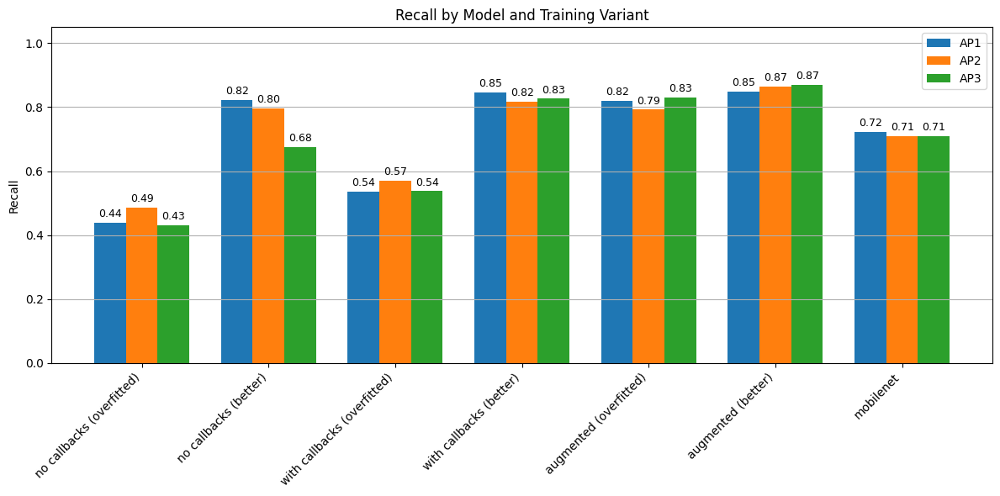

In [ ]:
AP1_rec = [
    results_AP1_overfitted[3],
    results_AP1_better[3],
    results_AP1_overfitted_with_callbacks[3],
    results_AP1_better_with_callbacks[3],
    results_AP1_overfitted_augmented[3],
    results_AP1_better_augmented[3],
    results_AP1_mobilenet[3]
]

AP2_rec = [
    results_AP2_overfitted[3],
    results_AP2_better[3],
    results_AP2_overfitted_with_callbacks[3],
    results_AP2_better_with_callbacks[3],
    results_AP2_overfitted_augmented[3],
    results_AP2_better_augmented[3],
    results_AP2_mobilenet[3]
]

AP3_rec = [
    results_AP3_overfitted[3],
    results_AP3_better[3],
    results_AP3_overfitted_with_callbacks[3],
    results_AP3_better_with_callbacks[3],
    results_AP3_overfitted_augmented[3],
    results_AP3_better_augmented[3],
    results_AP3_mobilenet[3]
]

plt.figure(figsize=(12, 6))

bars1 = plt.bar(x - width, AP1_rec, width, label='AP1')
bars2 = plt.bar(x, AP2_rec, width, label='AP2')
bars3 = plt.bar(x + width, AP3_rec, width, label='AP3')

plt.ylabel('Recall')
plt.title('Recall by Model and Training Variant')
plt.xticks(x, labels, rotation=45, ha='right')
plt.ylim(0, 1.05)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()

for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.01,
            f'{height:.2f}',
            ha='center',
            va='bottom',
            fontsize=9
        )

plt.show()


In [ ]:
# Accuracy
acc_all = [
    AP1_acc,
    AP2_acc,
    AP3_acc
]
acc_max_value = -1
acc_max_model = ""
for i, model_scores in enumerate(acc_all):
    for j, val in enumerate(model_scores):
        if val > acc_max_value:
            acc_max_value = val
            acc_max_model = f"AP{i+1} - {labels[j]}"

# Precision
prec_all = [
    AP1_prec,
    AP2_prec,
    AP3_prec
]
prec_max_value = -1
prec_max_model = ""
for i, model_scores in enumerate(prec_all):
    for j, val in enumerate(model_scores):
        if val > prec_max_value:
            prec_max_value = val
            prec_max_model = f"AP{i+1} - {labels[j]}"

# Recall
rec_all = [
    AP1_rec,
    AP2_rec,
    AP3_rec
]
rec_max_value = -1
rec_max_model = ""
for i, model_scores in enumerate(rec_all):
    for j, val in enumerate(model_scores):
        if val > rec_max_value:
            rec_max_value = val
            rec_max_model = f"AP{i+1} - {labels[j]}"

print(" Best model metrics:")
print(f" Accuracy:  {acc_max_value:.4f} – {acc_max_model}")
print(f" Precision: {prec_max_value:.4f} – {prec_max_model}")
print(f" Recall:    {rec_max_value:.4f} – {rec_max_model}")


 Best model metrics:
 Accuracy:  0.8801 – AP3 - augmented (better)
 Precision: 0.8942 – AP3 - augmented (better)
 Recall:    0.8702 – AP3 - augmented (better)


# Best and worst case scenarios for the best model

In [ ]:
import numpy as np

# Probability of the predicted class
confidences = np.max(predY, axis=1)
correct = predYClasses == trueY

# Indices for best-case and worst-case predictions
best_indices = np.argsort(-confidences[correct])[:3]
worst_indices = np.argsort(confidences[~correct])[:3]

# Mapping back to original X_test indices
correct_indices = np.where(correct)[0]
incorrect_indices = np.where(~correct)[0]

print("=== Best-case examples ===")
for i in best_indices:
    idx = correct_indices[i]
    print(f"Index: {idx}, True: {trueY[idx]}, Pred: {predYClasses[idx]}, Conf: {confidences[idx]:.4f}")

print("\n=== Worst-case examples ===")
for i in worst_indices:
    idx = incorrect_indices[i]
    print(f"Index: {idx}, True: {trueY[idx]}, Pred: {predYClasses[idx]}, Conf: {confidences[idx]:.4f}")


=== Best-case examples ===
Index: 403, True: 10, Pred: 10, Conf: 0.9999
Index: 299, True: 3, Pred: 3, Conf: 0.9998
Index: 418, True: 10, Pred: 10, Conf: 0.9998

=== Worst-case examples ===
Index: 327, True: 11, Pred: 6, Conf: 0.2352
Index: 379, True: 8, Pred: 4, Conf: 0.2487
Index: 325, True: 7, Pred: 3, Conf: 0.2806


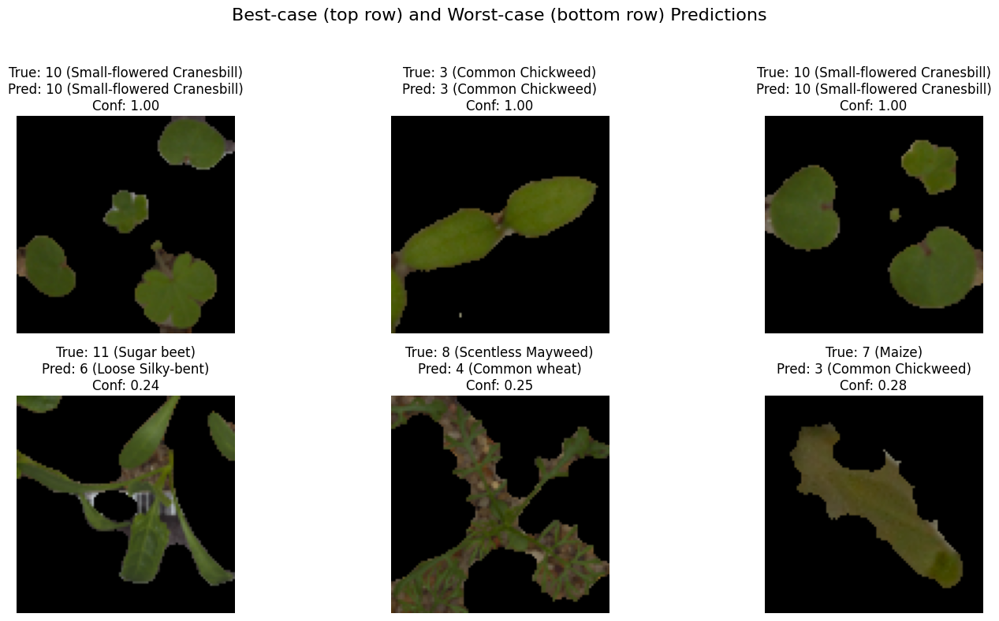

In [ ]:
def show_examples_grid(X, trueY, predY, conf, best_idxs, worst_idxs, index_to_label):
    fig, axes = plt.subplots(2, 3, figsize=(15, 8))
    fig.suptitle("Best-case (top row) and Worst-case (bottom row) Predictions", fontsize=16)

    # Top row: best-case
    for i, ax in enumerate(axes[0]):
        idx = correct_indices[best_idxs[i]]
        true_class = trueY[idx]
        pred_class = predY[idx]
        ax.imshow(X[idx])
        ax.set_title(
            f"True: {true_class} ({index_to_label[true_class]})\n"
            f"Pred: {pred_class} ({index_to_label[pred_class]})\n"
            f"Conf: {conf[idx]:.2f}"
        )
        ax.axis('off')

    # Bottom row: worst-case
    for i, ax in enumerate(axes[1]):
        idx = incorrect_indices[worst_idxs[i]]
        true_class = trueY[idx]
        pred_class = predY[idx]
        ax.imshow(X[idx])
        ax.set_title(
            f"True: {true_class} ({index_to_label[true_class]})\n"
            f"Pred: {pred_class} ({index_to_label[pred_class]})\n"
            f"Conf: {conf[idx]:.2f}"
        )
        ax.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


show_examples_grid(
    X_test_cleaned,
    trueY,
    predYClasses,
    confidences,
    best_indices,
    worst_indices,
    index_to_label
)


# Best model configuration and visualization

In [ ]:
model.summary()

Model: "functional_165"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_21      │ (None, 96, 96, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 48, 48,    │        864 │ input_layer_21[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 48, 48,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 48, 48,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 48, 48,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 48, 48,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 48, 48,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 48, 48,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 48, 48,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 49, 49,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 24, 24,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 24, 24,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 24, 24,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 24, 24,    │      2,304 │ block_1_depthwis

 Total params: 2,754,534 (10.51 MB)

 Trainable params: 165,516 (646.55 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 331,034 (1.26 MB)

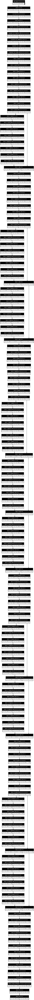

In [ ]:
plot_model(model, show_shapes=True, show_layer_names=True, to_file="model_AP3_better_augmented.png")